# Loading Dataset

In [ ]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import feature_extraction, linear_model, model_selection, preprocessing

In [ ]:

train_df= pd.read_csv('my_dataset.csv')
train_df 


,body,ques,question,equation,answer,label
0,bobby ate some pieces of candy . then he ate 2...,how many pieces of candy had he eaten at the s...,bobby ate some pieces of candy . then he ate 2...,(43 - 25),18.0,1
1,bobby ate some pieces of candy . then he ate 2...,how many pieces of candy had he eaten at the s...,bobby ate some pieces of candy . then he ate 2...,(43 + 25),68.0,0
2,bobby ate 28 pieces of candy . then he ate 42 ...,how many pieces of candy did bobby eat ?,bobby ate 28 pieces of candy . then he ate 42 ...,(28 + 42),70.0,1
3,bobby ate 28 pieces of candy . then he ate 42 ...,how many pieces of candy did bobby eat ?,bobby ate 28 pieces of candy . then he ate 42 ...,(28 - 42),-14.0,0
4,bobby ate 33 pieces of candy . then he ate 4 m...,how many pieces of candy and chocolate did bob...,bobby ate 33 pieces of candy . then he ate 4 m...,((33 + 4) + 14),51.0,1
...,...,...,...,...,...,...
7509,chris is inviting 82 friends to a party . he h...,how many cookies will each friend get ?,chris is inviting 82 friends to a party . he h...,(1804 * 82),147928.0,0
7510,keith has 5530 marbles and 3 pencils . if he s...,how many marbles does each friend get ?,keith has 5530 marbles and 3 pencils . if he s...,(5530 / 79),70.0,1
7511,keith has 5530 marbles and 3 pencils . if he s...,how many marbles does each friend get ?,keith has 5530 marbles and 3 pencils . if he s...,(5530 * 79),436870.0,0
7512,there are 43 students and 1720 apples . each s...,how many does each student get ?,there are 43 students and 1720 apples . each s...,(1720 / 43),40.0,1


In [ ]:
train_df['body'][0]

'bobby ate some pieces of candy . then he ate 25 more . if he ate a total of 43 pieces of candy'

In [ ]:
train_df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7509    False
7510    False
7511    False
7512    False
7513    False
Length: 7514, dtype: bool

In [ ]:
train_df.duplicated().sum()

0

In [ ]:
train_df.describe()

,answer,label
count,7.514000e+03,7514.000000
mean,3.898667e+03,0.500000
std,7.083482e+04,0.500033
min,-4.519290e+05,0.000000
25%,4.000000e+00,0.000000
50%,2.000000e+01,0.500000
75%,8.000000e+01,1.000000
max,4.050000e+06,1.000000


In [ ]:
train_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7514 entries, 0 to 7513
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   body      7514 non-null   object 
 1   ques      7512 non-null   object 
 2   question  7514 non-null   object 
 3   equation  7514 non-null   object 
 4   answer    7514 non-null   float64
 5   label     7514 non-null   int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 352.3+ KB


In [ ]:
train_df.isna().sum()

body        0
ques        2
question    0
equation    0
answer      0
label       0
dtype: int64

# ***Data Preparation***

### 1. Removing punctuations

In [ ]:
# re :  regular expression support.
import re

In [ ]:
train_df['clean_text1'] = train_df['body'].map(lambda x: re.sub('[,\.! ? ]()', ' ', x))
train_df['clean_text2'] = train_df['clean_text1'].map(lambda x: re.sub("'s", 'is', x))
train_df['clean_text3'] = train_df['clean_text2'].map(lambda x: re.sub("'m", 'am', x))
train_df['clean_text'] = train_df['clean_text3'].map(lambda x: re.sub("'re", 'are', x))

In [ ]:
train_df['clean_text'][55]

'in a school there are 706 girls and 222 boys   418 more girls joined the school  '

In [ ]:
train_df['clean_text']

0       bobby ate some pieces of candy   then he ate 2...
1       bobby ate some pieces of candy   then he ate 2...
2       bobby ate 28 pieces of candy   then he ate 42 ...
3       bobby ate 28 pieces of candy   then he ate 42 ...
4       bobby ate 33 pieces of candy   then he ate 4 m...
                              ...                        
7509    chris is inviting 82 friends to a party   he h...
7510    keith has 5530 marbles and 3 pencils   if he s...
7511    keith has 5530 marbles and 3 pencils   if he s...
7512    there are 43 students and 1720 apples   each s...
7513    there are 43 students and 1720 apples   each s...
Name: clean_text, Length: 7514, dtype: object

In [ ]:
train_df['clean_text'] 

0       bobby ate some pieces of candy   then he ate 2...
1       bobby ate some pieces of candy   then he ate 2...
2       bobby ate 28 pieces of candy   then he ate 42 ...
3       bobby ate 28 pieces of candy   then he ate 42 ...
4       bobby ate 33 pieces of candy   then he ate 4 m...
                              ...                        
7509    chris is inviting 82 friends to a party   he h...
7510    keith has 5530 marbles and 3 pencils   if he s...
7511    keith has 5530 marbles and 3 pencils   if he s...
7512    there are 43 students and 1720 apples   each s...
7513    there are 43 students and 1720 apples   each s...
Name: clean_text, Length: 7514, dtype: object

### 2. Lowercase all text:

In [ ]:
train_df['clean_text'] = train_df['clean_text'].map(lambda x: x.lower())

In [ ]:
train_df['clean_text'].sample(10)

1727    mrs  hilt bought an ice cream cone for 99 0 ce...
1116    he then went to see the oranges being harveste...
4924    there are 48 0 pencils and 40 0 scissors in th...
2463    justin needs 61 0 paper plates for a birthday ...
5953    ted has 15 candy bars   he wants to put them i...
4813    jordan builds a model ' 52 0 mustang   if the ...
4944    kelly bought 0 1 pounds of peanuts and 0 4 pou...
1426    luke played a trivia game and gained 3 points ...
6234    mr  lee harvested 495 apples and he packed the...
4946    there was a stack of 700 0 sheets of used pape...
Name: clean_text, dtype: object

### 3. Remove HTML characters

In [ ]:
html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
train_df['clean_text'] = train_df['clean_text'].apply(lambda x: re.sub(html,'', x))

In [ ]:
train_df['clean_text'].sample(10)

2397    14 0 birds were sitting in a tree   21 0 more ...
779     paco had 17 cookies   he ate 14 cookies and ga...
1389    in haley is class 13 boys love to play marbles...
7193    at the arcade jerry won 29 tickets playing 'wh...
6439    chris has 18 soccer cards   his friend charlie...
5903    beth has 106 crayons   she gives 54 of them aw...
2704      bobby has 142 0 books   kristi has 78 0 books  
4097    tori is a school janitor   last week   she pic...
4488    mildred collects 77 0 oranges   mildred is fat...
1103    danny collects bottle caps and wrappers   he f...
Name: clean_text, dtype: object

### 4. Remove \n

In [ ]:
train_df['clean_text'] = train_df['clean_text'].apply(lambda x: re.sub('\n','', x))

In [ ]:
train_df['clean_text'].sample(10)

2861    on 3 0 consecutive passes   a football team ga...
1313    there are 141 pots   each pot has 71 flowers a...
315     allan brought 3 balloons and jake brought 5 ba...
4601    there are 96 0 oranges in a box   jonathan tak...
4718    adam bought 2 0 boxes of chocolate candy and 5...
5983    58 children are taking a bus to the zoo   they...
1536    matthew gave equal numbers of crackers and cak...
4468    steven wants to split a collection of cards in...
1548    rebecca wants to split a collection of eggs in...
4517    sara grew 43 0 pumpkins   but the rabbits ate ...
Name: clean_text, dtype: object

### 5. Remove Non-English characters

In [ ]:
train_df['clean_text'] = train_df['clean_text'].apply(lambda x: re.sub(r'[^\x00-\x7f $ &]',r'', x))

In [ ]:
train_df['clean_text']

0       bobby ate some pieces of candy   then he ate 2...
1       bobby ate some pieces of candy   then he ate 2...
2       bobby ate 28 pieces of candy   then he ate 42 ...
3       bobby ate 28 pieces of candy   then he ate 42 ...
4       bobby ate 33 pieces of candy   then he ate 4 m...
                              ...                        
7509    chris is inviting 82 friends to a party   he h...
7510    keith has 5530 marbles and 3 pencils   if he s...
7511    keith has 5530 marbles and 3 pencils   if he s...
7512    there are 43 students and 1720 apples   each s...
7513    there are 43 students and 1720 apples   each s...
Name: clean_text, Length: 7514, dtype: object

# ***Data Modeling and Tokenization***

## 1. Removing stop words and Lemmatization

### 1.1 Using gensim NLTK library for removing stop words

In [ ]:
import gensim
from gensim.utils import simple_preprocess
import nltk

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize



In [ ]:
import pandas as pd
import nltk
import multiprocessing
from nltk.corpus import stopwords

# Load dataset column into a pandas DataFrame


# Define number of CPU cores to use for parallel processing
num_cores = multiprocessing.cpu_count()


In [ ]:
train_df['clean_text'][0]

'bobby ate some pieces of candy   then he ate 25 more   if he ate a total of 43 pieces of candy'

In [ ]:
import nltk
from nltk.corpus import stopwords
#nltk.download('stopwords')
# Load stop words from NLTK library
stop_words = stopwords.words('english')
stop_words = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'about', 'against', 'between', 'into', 'through', 'during', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]

# Your large dataset, stored in a list called "data"
data = train_df['clean_text']
# Remove stop words from the 'clean_text' column in the DataFrame
train_df['clean_text'] = train_df['clean_text'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

In [ ]:
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
train_df['clean_text'][0]

'bobby ate pieces candy ate 25 ate total 43 pieces candy'

In [ ]:
text_to_list = train_df.clean_text.values.tolist()

In [ ]:
text_to_list

['bobby ate pieces candy ate 25 ate total 43 pieces candy',
 'bobby ate pieces candy ate 25 ate total 43 pieces candy',
 'bobby ate 28 pieces candy ate 42 also ate 63 pieces chocolate',
 'bobby ate 28 pieces candy ate 42 also ate 63 pieces chocolate',
 'bobby ate 33 pieces candy ate 4 also ate 14 pieces chocolate',
 'bobby ate 33 pieces candy ate 4 also ate 14 pieces chocolate',
 'bobby ate 38 pieces candy ate 36 also ate 16 pieces chocolate',
 'bobby ate 38 pieces candy ate 36 also ate 16 pieces chocolate',
 'bobby had 20 pieces candy ate 34 pieces candy ate 18',
 'bobby had 20 pieces candy ate 34 pieces candy ate 18',
 'bobby had 21 pieces candy ate 5 pieces candy ate 9',
 'bobby had 21 pieces candy ate 5 pieces candy ate 9',
 'bobby had 22 pieces candy ate pieces candy ate 5 still has 8 pieces candy left',
 'bobby had 22 pieces candy ate pieces candy ate 5 still has 8 pieces candy left',
 'bobby had 19 pieces candy ate 2 pieces candy',
 'bobby had 19 pieces candy ate 2 pieces candy'

In [ ]:
len(text_to_list)


7514

In [ ]:
# If you set deacc=True which will removes the punctuations (that we already removed)
def convert_sentences_to_words(sentences):
    for sentence in sentences:        
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [ ]:
text_as_words = list(convert_sentences_to_words(text_to_list))

In [ ]:
len(text_as_words)

7514

In [ ]:
print(text_as_words[1])

['bobby', 'ate', 'pieces', 'candy', 'ate', 'ate', 'total', 'pieces', 'candy']


In [ ]:
len(text_as_words[1])

9

# 2. Creating Bigram *(2 words compound words)* and Trigram *(3 words compound words)*

In [ ]:
# Note if you will use higher threshold, which will return the fewer phrases.
bigram = gensim.models.Phrases(text_as_words, min_count=5, threshold=100) 
trigram = gensim.models.Phrases(bigram[text_as_words], threshold=100) 

In [ ]:
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]


In [ ]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

##4. Using Spacy library for removing stop words

In [ ]:
# Importing spacy and Loading model
import spacy

nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

In [ ]:
# Form Bigrams
clean_words_bigrams = make_bigrams(text_as_words)

In [ ]:
# Do lemmatization keeping only noun, adj, vb, adv
clean_words_lemmatized = lemmatization(clean_words_bigrams, allowed_postags=['NOUN', 'VERB','adj','adv'])

In [ ]:
#pip install nlp

In [ ]:
print(clean_words_lemmatized)

[['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'candy'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'candy'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['eat', 'piece', 'candy', 'eat', 'eat', 'piece', 'chocolate'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat', 'piece', 'candy', 'leave'], ['piece', 'candy', 'eat', 'piece', 'candy', 'eat', 'piece', 'candy', 'leave'], ['piece', 'candy', 'eat', 'piece', 'candy'], ['piece', 'candy', 'eat', 'piece', 'candy'], ['piece', 'candy', 'eat', 'piece', 'candy', 'pi

# 5. Tokenizing the clean and lemmatize words

In [ ]:
print(len(text_as_words))
print(len(text_as_words[0]))
print(len(text_as_words[99]))

7514
9
21


In [ ]:
#input liste de liste de tokens
def pos_tagging_nltk(tokens):
    return [nltk.pos_tag(w) for w in tokens if w]

In [ ]:
pos_tagging_nltk(clean_words_lemmatized)

[[('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('chocolate', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('chocolate', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('chocolate', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('chocolate', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'NN'),
  ('piece', 'NN'),
  ('chocolate', 'NN')],
 [('eat', 'NN'),
  ('piece', 'NN'),
  ('candy', 'NN'),
  ('eat', 'NN'),
  ('eat', 'N

# Image

In [ ]:
/////////////////////////////////////

In [ ]:
! git clone https://github.com/microsoft/fluentui-emoji

In [ ]:
#pip install pyttsx3

In [ ]:
#pip install playsound

# /////////////////////////////////GAN

In [ ]:
import os
print(os.listdir("fluentui-emoji/assets"))

['1st place medal', '2nd place medal', '3rd place medal', 'A button blood type', 'Ab button blood type', 'Abacus', 'Accordion', 'Adhesive bandage', 'Admission tickets', 'Aerial tramway', 'Airplane', 'Airplane arrival', 'Airplane departure', 'Alarm clock', 'Alembic', 'Alien', 'Alien monster', 'Ambulance', 'American football', 'Amphora', 'Anatomical heart', 'Anchor', 'Anger symbol', 'Angry face', 'Angry face with horns', 'Anguished face', 'Ant', 'Antenna bars', 'Anxious face with sweat', 'Aquarius', 'Aries', 'Articulated lorry', 'Artist', 'Artist palette', 'Astonished face', 'Astronaut', 'Atm sign', 'Atom symbol', 'Auto rickshaw', 'Automobile', 'Avocado', 'Axe', 'B button blood type', 'Baby', 'Baby angel', 'Baby bottle', 'Baby chick', 'Baby symbol', 'Back arrow', 'Backhand index pointing down', 'Backhand index pointing left', 'Backhand index pointing right', 'Backhand index pointing up', 'Backpack', 'Bacon', 'Badger', 'Badminton', 'Bagel', 'Baggage claim', 'Baguette bread', 'Balance scal

In [ ]:
#pip install torchvision

In [ ]:
#pip install torchtext


In [ ]:
#pip install torch


In [ ]:
from torchvision import transforms


# Image Preprocessing

In [ ]:
from torchtext import datasets
from torchvision import datasets
import torch


# Now you can use the datasets module
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('fluentui-emoji/assets/', transform=transform)

train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


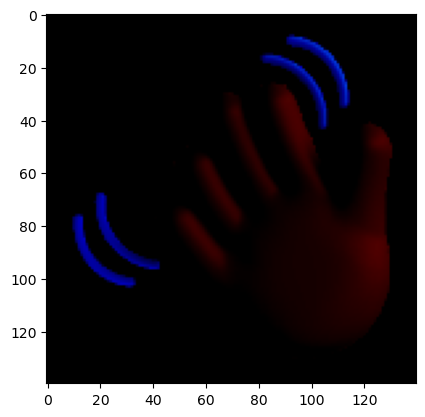

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


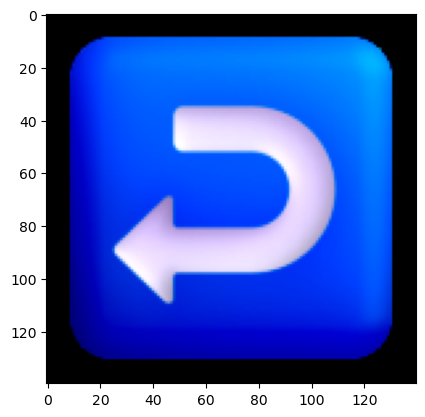

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


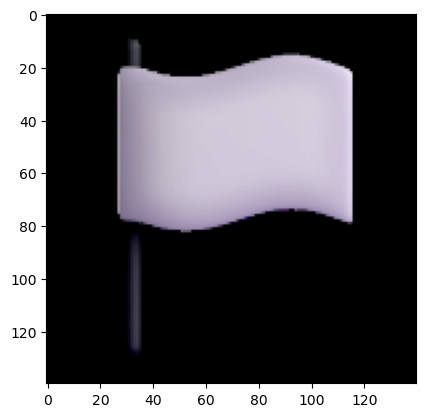

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


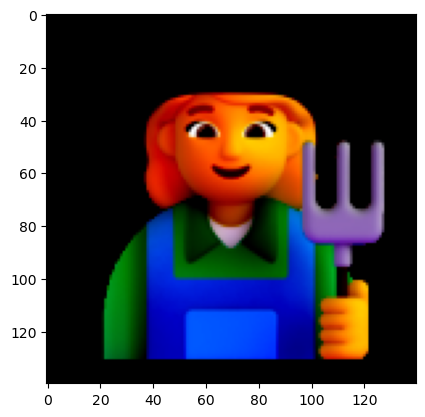

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


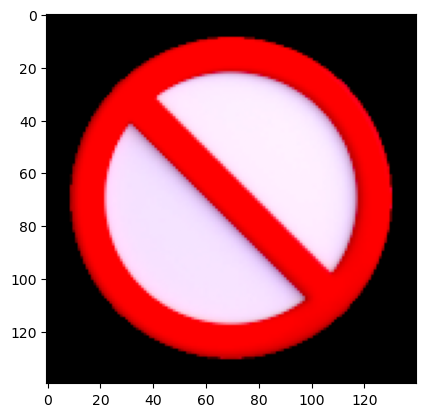

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


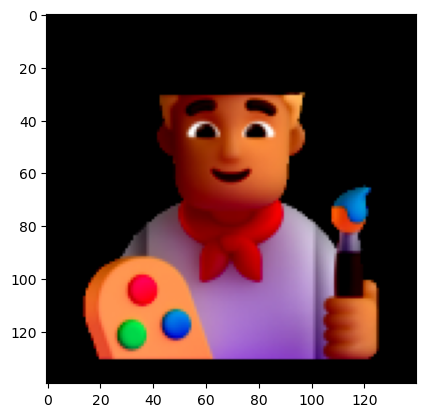

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


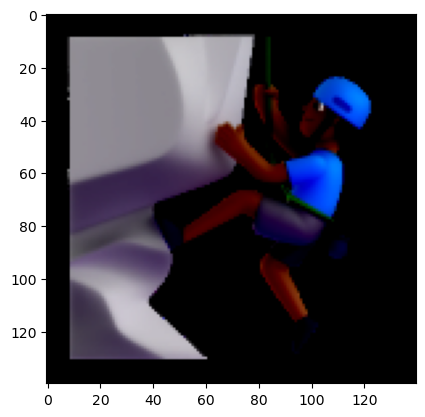

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


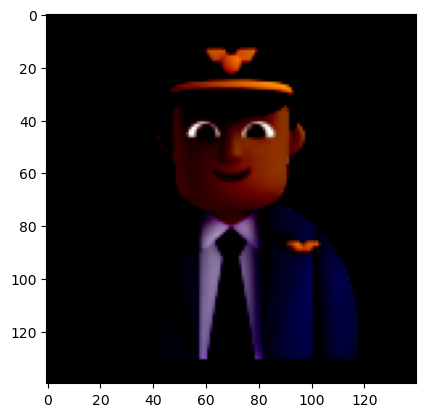

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


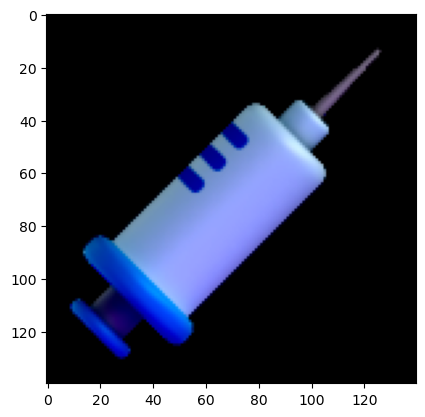

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


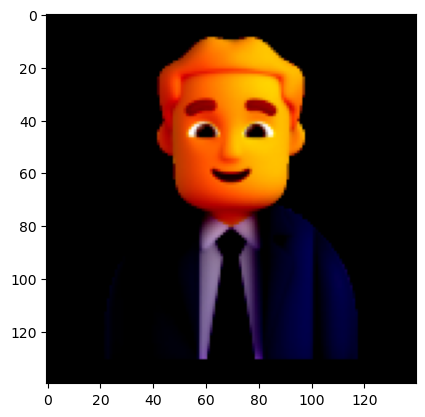

In [ ]:
import matplotlib.pyplot as plt

for i in range(10):
    plt.imshow(imgs[i])
    plt.show()

# Weights

In [ ]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [ ]:
import torch.nn as nn

class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [ ]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

# /////////////////setup

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Training

# Initialize models and optimizers

In [ ]:
batch_size = 32
#learning rates for the generator and discriminator
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [ ]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [ ]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (150,150))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

# Training Loop

Loss_D:The loss function is a measure of how well the discriminator is able to distinguish between real and generated images.

Loss_G:The loss function is a measure of how well the generator is able to produce realistic images.

 50%|█████████████████████████████████████████                                         | 47/94 [02:25<02:12,  2.83s/it]

[1/100][47/94] Loss_D: 1.5458 Loss_G: 5.7352 D(x): 0.7817 D(G(z)): 0.6252 / 0.0018


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [04:57<00:00,  3.17s/it]

[1/100][94/94] Loss_D: 1.0638 Loss_G: 2.1667 D(x): 0.4680 D(G(z)): 0.2253 / 0.0923


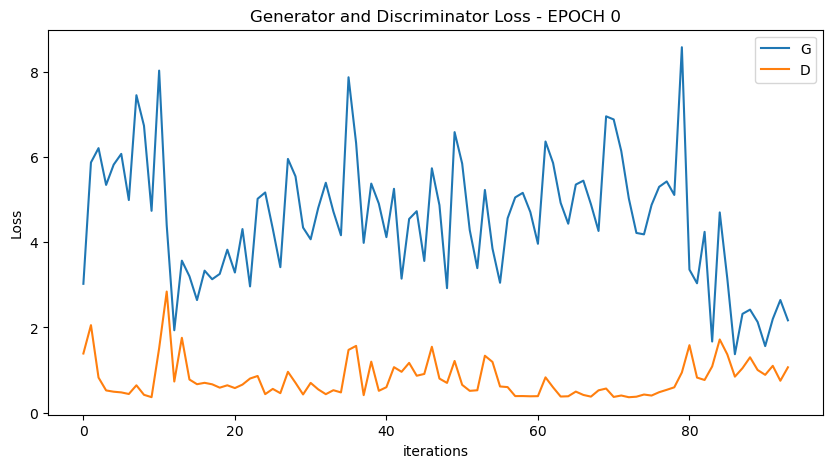

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


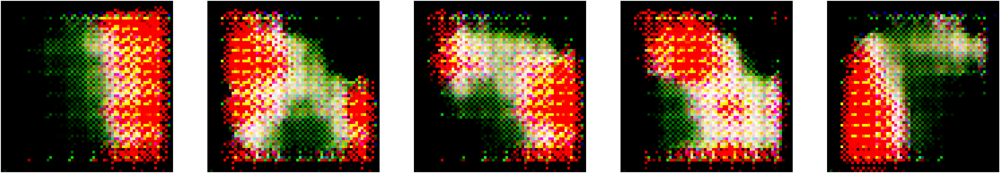

 50%|█████████████████████████████████████████                                         | 47/94 [02:18<02:16,  2.90s/it]

[2/100][47/94] Loss_D: 0.9843 Loss_G: 1.6818 D(x): 0.6231 D(G(z)): 0.3217 / 0.1710


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [04:35<00:00,  2.93s/it]

[2/100][94/94] Loss_D: 1.4614 Loss_G: 2.5924 D(x): 0.4018 D(G(z)): 0.3607 / 0.0663


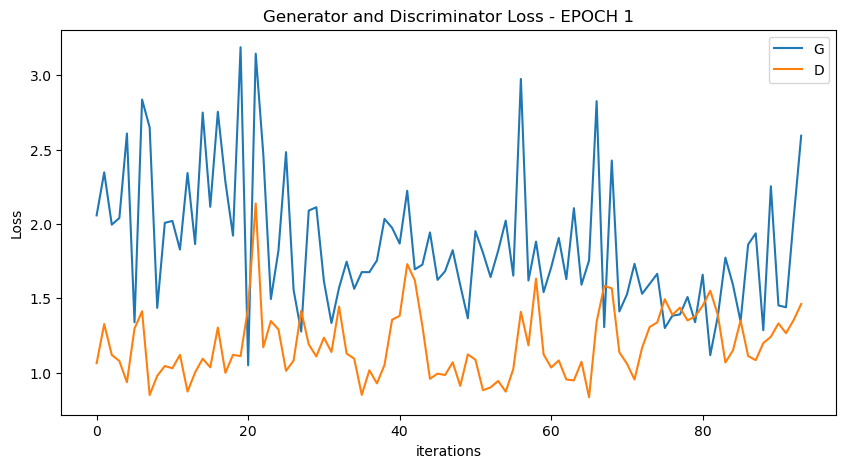

 50%|█████████████████████████████████████████                                         | 47/94 [01:16<01:31,  1.94s/it]

[3/100][47/94] Loss_D: 1.4494 Loss_G: 1.3703 D(x): 0.3876 D(G(z)): 0.3525 / 0.2369


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:37<00:00,  1.68s/it]

[3/100][94/94] Loss_D: 1.4038 Loss_G: 2.0038 D(x): 0.3683 D(G(z)): 0.3312 / 0.1139


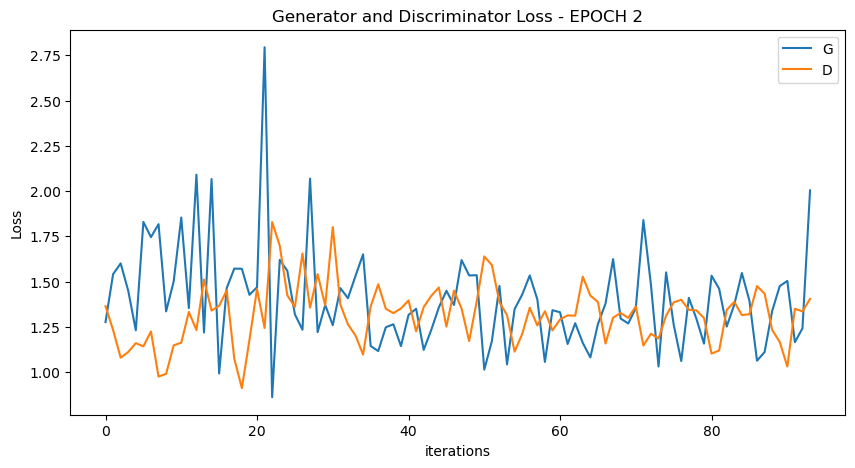

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:23,  1.79s/it]

[4/100][47/94] Loss_D: 1.3915 Loss_G: 1.3289 D(x): 0.6218 D(G(z)): 0.5523 / 0.2486


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[4/100][94/94] Loss_D: 1.7455 Loss_G: 1.6398 D(x): 0.3277 D(G(z)): 0.3746 / 0.1715


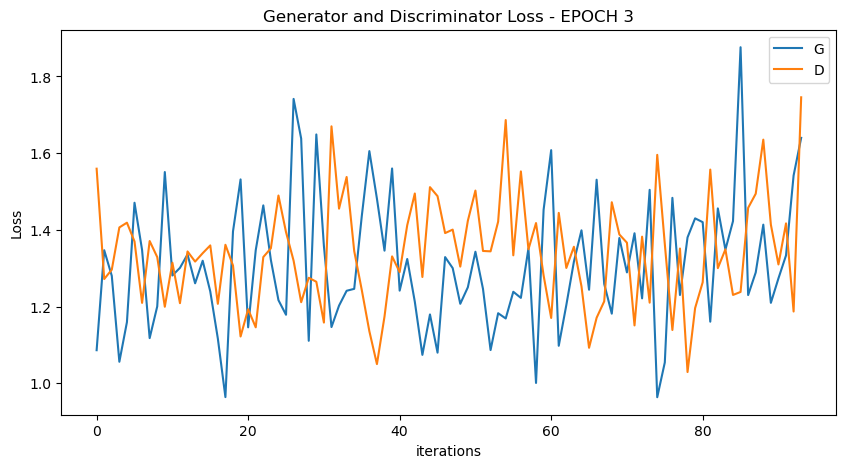

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:20,  1.71s/it]

[5/100][47/94] Loss_D: 1.4269 Loss_G: 1.2602 D(x): 0.3963 D(G(z)): 0.3726 / 0.2745


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[5/100][94/94] Loss_D: 1.1780 Loss_G: 2.8035 D(x): 0.5353 D(G(z)): 0.3524 / 0.0605


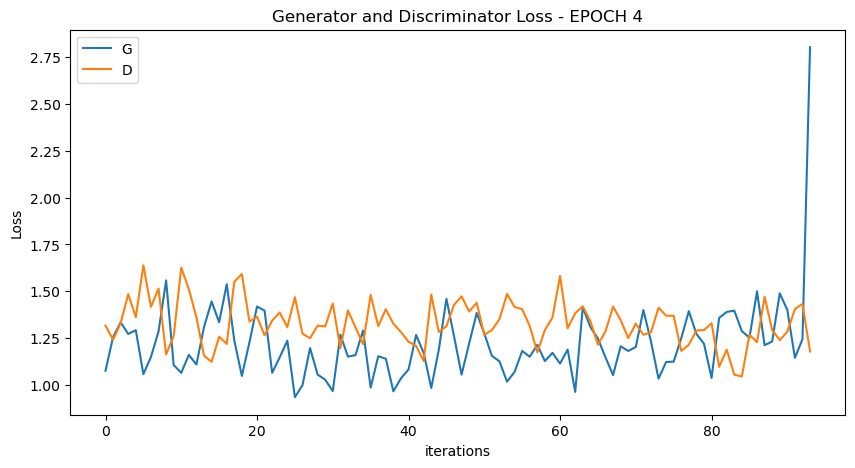

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:26,  1.84s/it]

[6/100][47/94] Loss_D: 1.2593 Loss_G: 1.7165 D(x): 0.5669 D(G(z)): 0.4613 / 0.1626


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:47<00:00,  1.79s/it]

[6/100][94/94] Loss_D: 1.4127 Loss_G: 1.5983 D(x): 0.4168 D(G(z)): 0.3891 / 0.1907


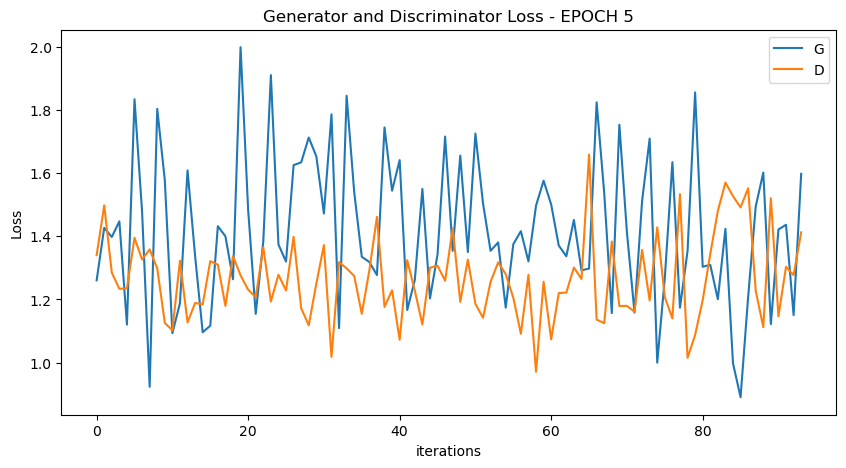

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:23,  1.77s/it]

[7/100][47/94] Loss_D: 1.3000 Loss_G: 1.2664 D(x): 0.5442 D(G(z)): 0.4556 / 0.2608


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[7/100][94/94] Loss_D: 1.2924 Loss_G: 1.8452 D(x): 0.4006 D(G(z)): 0.2814 / 0.1660


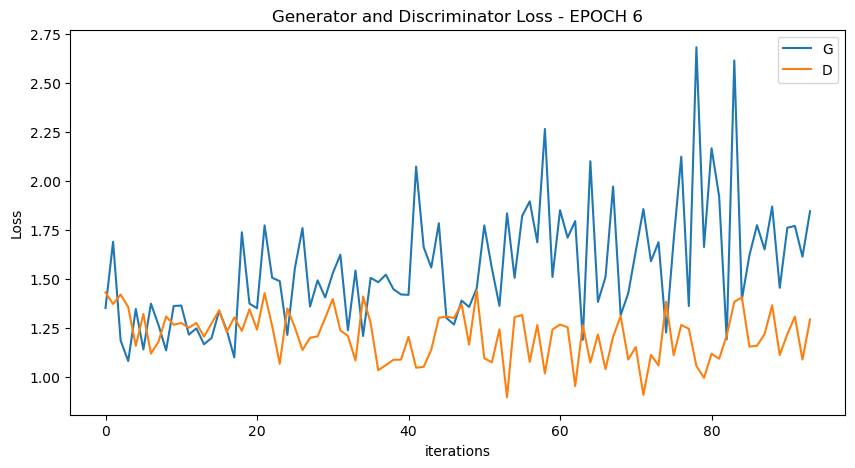

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:22,  1.76s/it]

[8/100][47/94] Loss_D: 1.2548 Loss_G: 2.5685 D(x): 0.7485 D(G(z)): 0.5355 / 0.0765


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:46<00:00,  1.77s/it]

[8/100][94/94] Loss_D: 1.1530 Loss_G: 5.0917 D(x): 0.7738 D(G(z)): 0.5329 / 0.0038


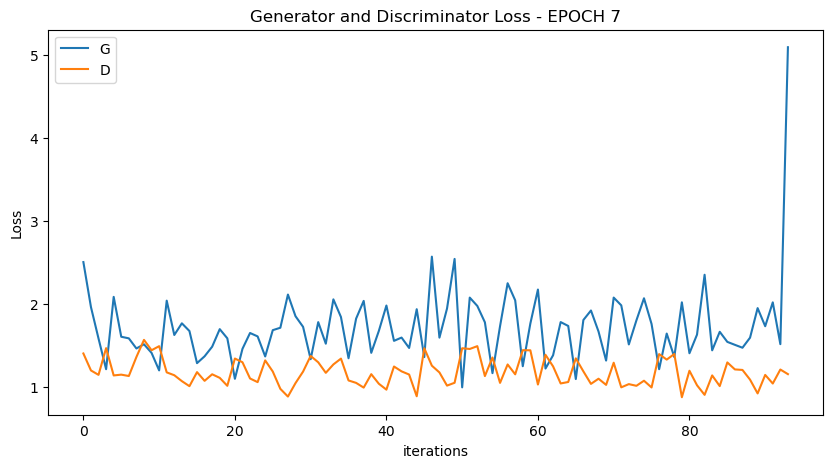

 50%|█████████████████████████████████████████                                         | 47/94 [01:25<01:26,  1.85s/it]

[9/100][47/94] Loss_D: 1.2126 Loss_G: 1.3214 D(x): 0.4821 D(G(z)): 0.3229 / 0.2528


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:48<00:00,  1.80s/it]

[9/100][94/94] Loss_D: 1.1023 Loss_G: 2.3685 D(x): 0.4917 D(G(z)): 0.2443 / 0.2033


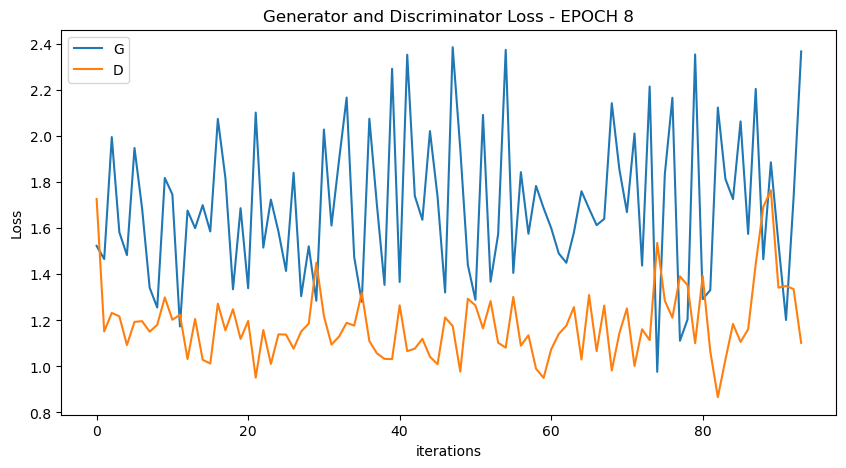

 50%|█████████████████████████████████████████                                         | 47/94 [01:26<01:24,  1.79s/it]

[10/100][47/94] Loss_D: 1.1799 Loss_G: 1.4901 D(x): 0.5582 D(G(z)): 0.3820 / 0.2199


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:52<00:00,  1.84s/it]

[10/100][94/94] Loss_D: 0.8007 Loss_G: 3.0014 D(x): 0.6605 D(G(z)): 0.2577 / 0.0423


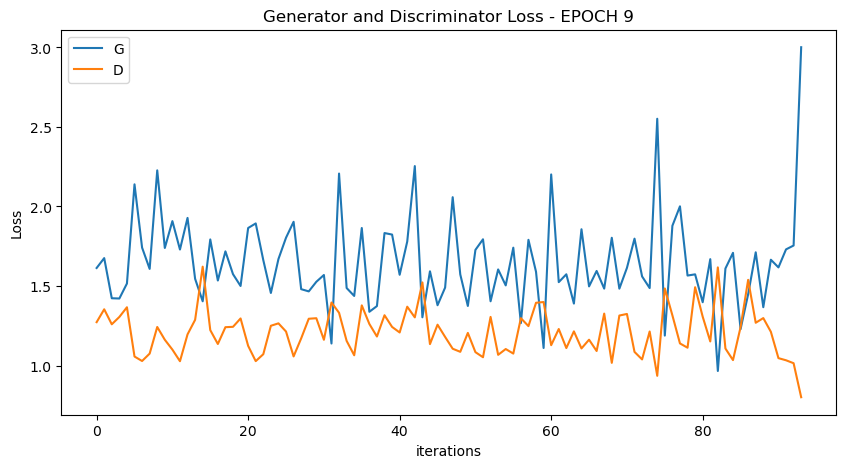

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:21,  1.74s/it]

[11/100][47/94] Loss_D: 1.0645 Loss_G: 2.1386 D(x): 0.6128 D(G(z)): 0.3473 / 0.1130


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:42<00:00,  1.73s/it]

[11/100][94/94] Loss_D: 0.9090 Loss_G: 2.0881 D(x): 0.5230 D(G(z)): 0.1585 / 0.1114


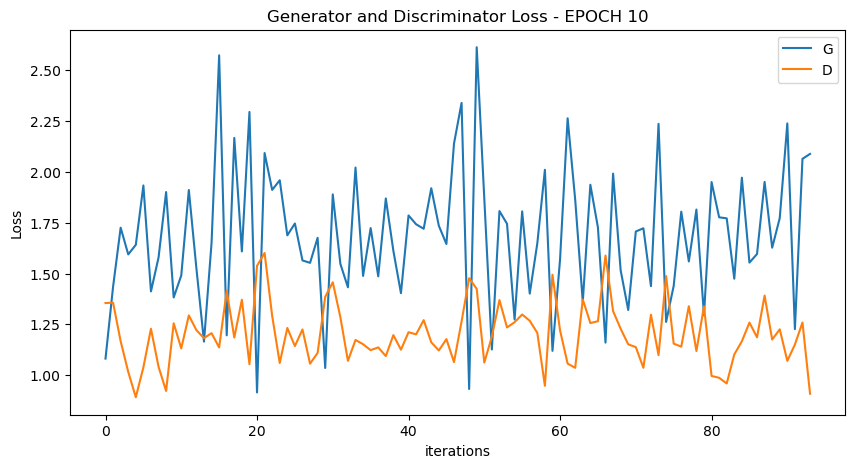

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


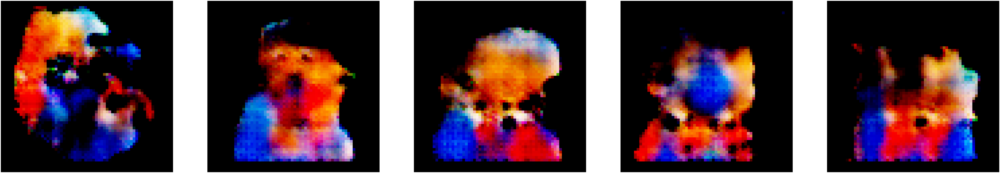

 50%|█████████████████████████████████████████                                         | 47/94 [02:02<02:30,  3.20s/it]

[12/100][47/94] Loss_D: 1.2819 Loss_G: 1.2015 D(x): 0.4172 D(G(z)): 0.2453 / 0.2987


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:47<00:00,  2.42s/it]

[12/100][94/94] Loss_D: 0.9251 Loss_G: 2.4587 D(x): 0.5680 D(G(z)): 0.2633 / 0.0715


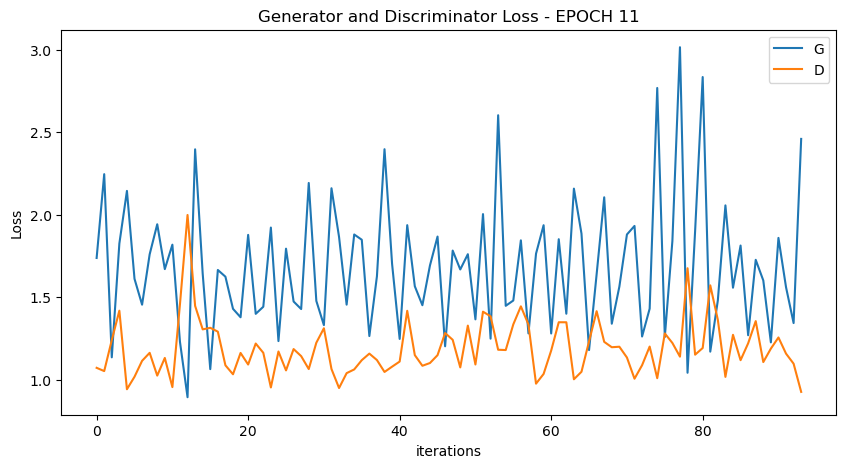

 50%|█████████████████████████████████████████                                         | 47/94 [01:28<01:23,  1.77s/it]

[13/100][47/94] Loss_D: 0.9437 Loss_G: 1.8027 D(x): 0.6451 D(G(z)): 0.2728 / 0.1540


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:49<00:00,  1.80s/it]

[13/100][94/94] Loss_D: 1.7758 Loss_G: 1.3378 D(x): 0.2612 D(G(z)): 0.2567 / 0.2434


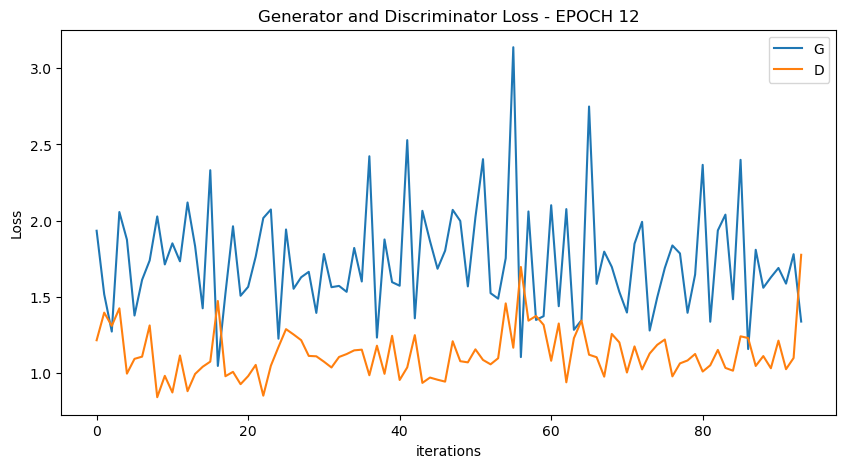

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:22,  1.75s/it]

[14/100][47/94] Loss_D: 0.9241 Loss_G: 2.0255 D(x): 0.6727 D(G(z)): 0.2999 / 0.1236


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[14/100][94/94] Loss_D: 0.9867 Loss_G: 4.0560 D(x): 0.5995 D(G(z)): 0.3039 / 0.0158


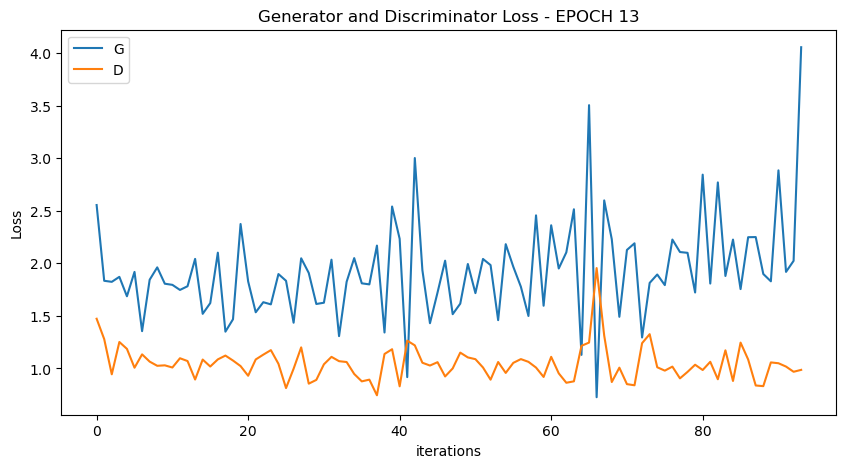

 50%|█████████████████████████████████████████                                         | 47/94 [01:27<01:16,  1.62s/it]

[15/100][47/94] Loss_D: 0.9432 Loss_G: 1.5065 D(x): 0.5401 D(G(z)): 0.2136 / 0.2126


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[15/100][94/94] Loss_D: 0.6607 Loss_G: 3.6847 D(x): 0.7410 D(G(z)): 0.1991 / 0.0178


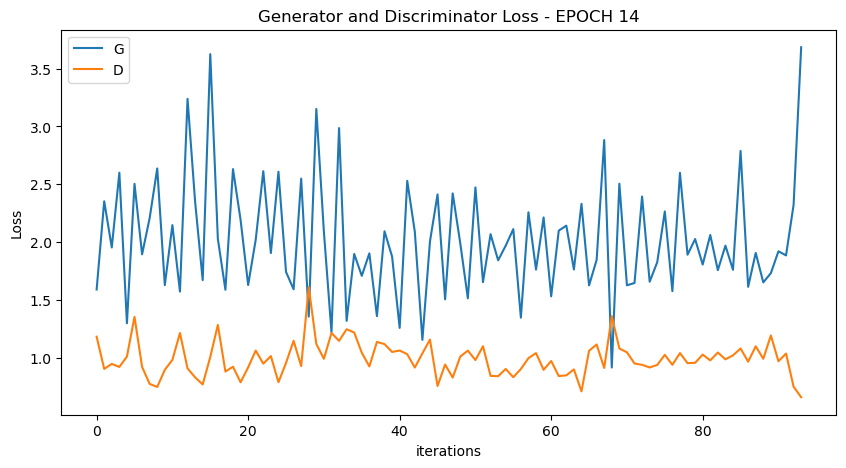

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:14,  1.59s/it]

[16/100][47/94] Loss_D: 0.8072 Loss_G: 2.4054 D(x): 0.6579 D(G(z)): 0.2197 / 0.0898


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:34<00:00,  1.65s/it]

[16/100][94/94] Loss_D: 0.7443 Loss_G: 2.9471 D(x): 0.5636 D(G(z)): 0.0957 / 0.0598


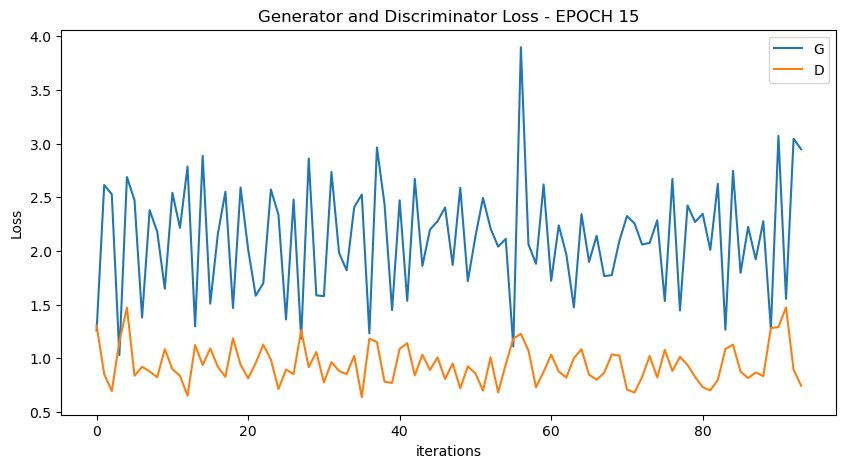

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:26,  1.85s/it]

[17/100][47/94] Loss_D: 0.8403 Loss_G: 2.5486 D(x): 0.7211 D(G(z)): 0.2815 / 0.0753


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:40<00:00,  1.71s/it]

[17/100][94/94] Loss_D: 1.1074 Loss_G: 1.4264 D(x): 0.3784 D(G(z)): 0.1425 / 0.2778


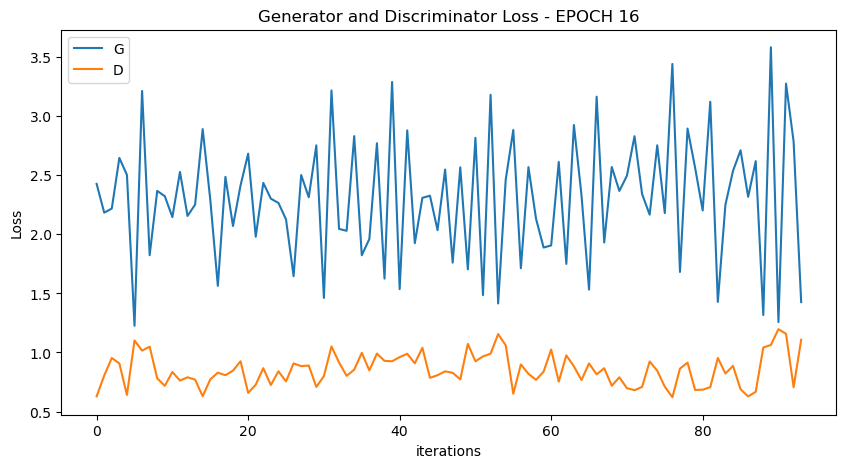

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:11,  1.52s/it]

[18/100][47/94] Loss_D: 0.8404 Loss_G: 2.4094 D(x): 0.7036 D(G(z)): 0.2734 / 0.0807


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[18/100][94/94] Loss_D: 0.5236 Loss_G: 4.3218 D(x): 0.8345 D(G(z)): 0.1582 / 0.0145


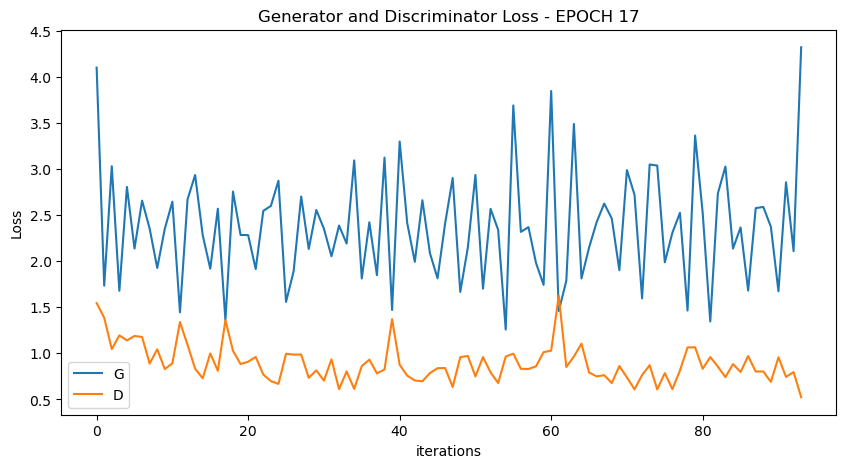

 50%|█████████████████████████████████████████                                         | 47/94 [01:15<01:15,  1.61s/it]

[19/100][47/94] Loss_D: 0.7573 Loss_G: 2.0259 D(x): 0.6246 D(G(z)): 0.1297 / 0.1385


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:30<00:00,  1.60s/it]

[19/100][94/94] Loss_D: 0.5674 Loss_G: 3.1221 D(x): 0.6716 D(G(z)): 0.0665 / 0.0338


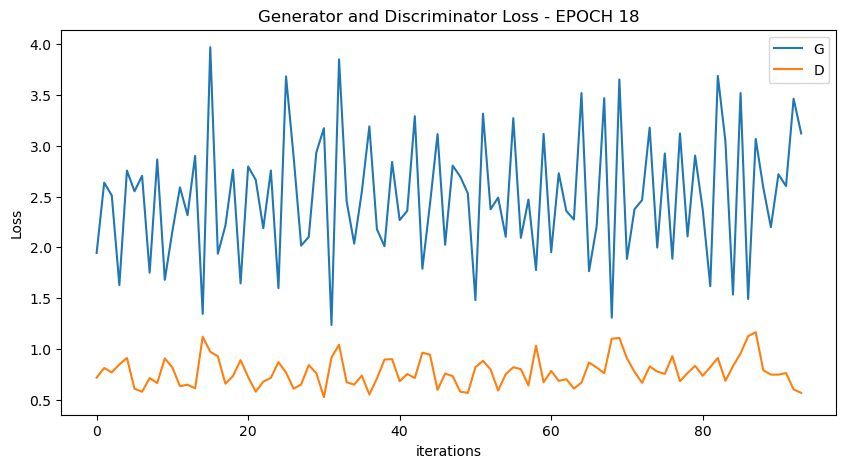

 50%|█████████████████████████████████████████                                         | 47/94 [01:13<01:17,  1.64s/it]

[20/100][47/94] Loss_D: 0.9284 Loss_G: 2.3657 D(x): 0.6629 D(G(z)): 0.2607 / 0.0988


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:28<00:00,  1.58s/it]

[20/100][94/94] Loss_D: 0.5034 Loss_G: 3.8525 D(x): 0.8621 D(G(z)): 0.0836 / 0.0155


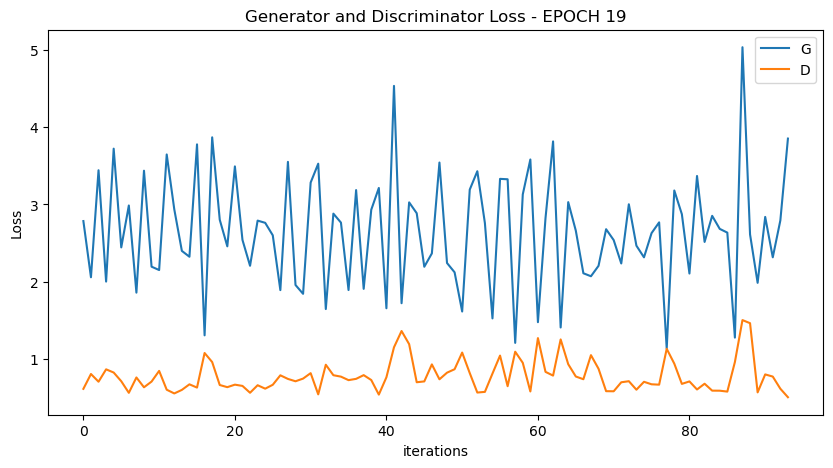

 50%|█████████████████████████████████████████                                         | 47/94 [01:19<01:24,  1.80s/it]

[21/100][47/94] Loss_D: 0.8854 Loss_G: 2.6401 D(x): 0.5102 D(G(z)): 0.0482 / 0.0775


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:04<00:00,  1.96s/it]

[21/100][94/94] Loss_D: 0.4486 Loss_G: 4.3978 D(x): 0.8770 D(G(z)): 0.1001 / 0.0090


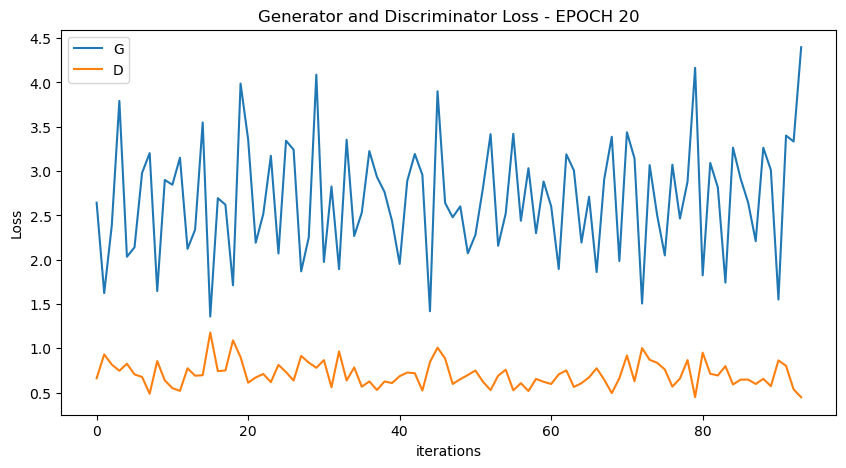

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


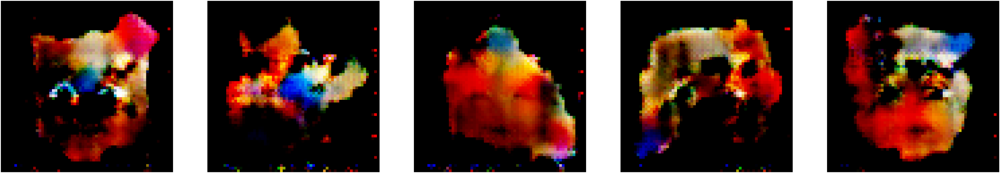

 50%|█████████████████████████████████████████                                         | 47/94 [02:51<02:44,  3.50s/it]

[22/100][47/94] Loss_D: 0.6295 Loss_G: 3.5145 D(x): 0.8354 D(G(z)): 0.1952 / 0.0272


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [05:32<00:00,  3.54s/it]

[22/100][94/94] Loss_D: 1.1139 Loss_G: 3.1456 D(x): 0.4919 D(G(z)): 0.2608 / 0.0385


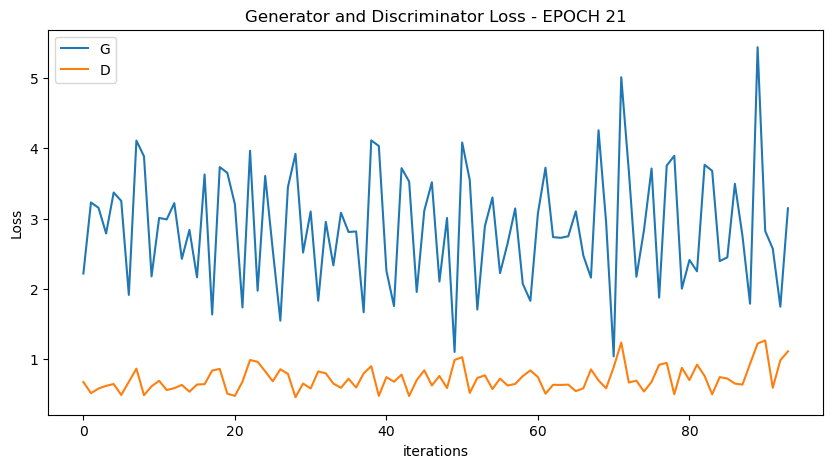

 50%|█████████████████████████████████████████                                         | 47/94 [01:19<01:23,  1.78s/it]

[23/100][47/94] Loss_D: 0.8273 Loss_G: 1.8401 D(x): 0.5458 D(G(z)): 0.0761 / 0.1992


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[23/100][94/94] Loss_D: 1.1442 Loss_G: 5.2411 D(x): 0.5616 D(G(z)): 0.1272 / 0.0037


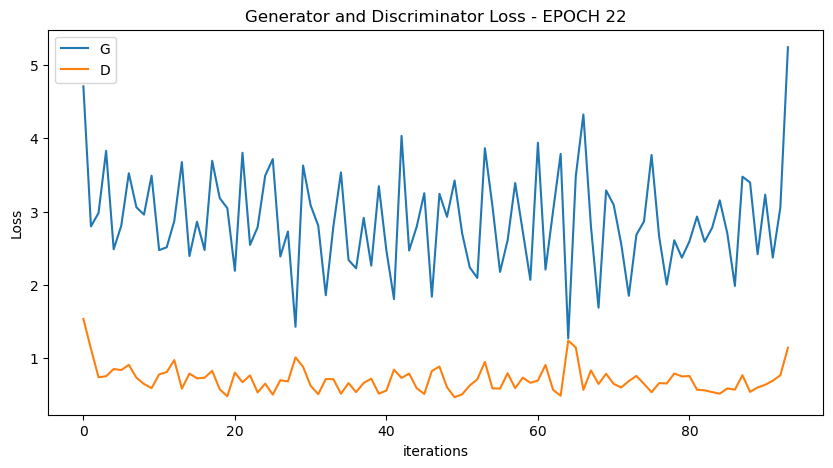

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:23,  1.77s/it]

[24/100][47/94] Loss_D: 0.7136 Loss_G: 2.3959 D(x): 0.6205 D(G(z)): 0.0827 / 0.0908


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[24/100][94/94] Loss_D: 0.4975 Loss_G: 3.9196 D(x): 0.7569 D(G(z)): 0.0420 / 0.0131


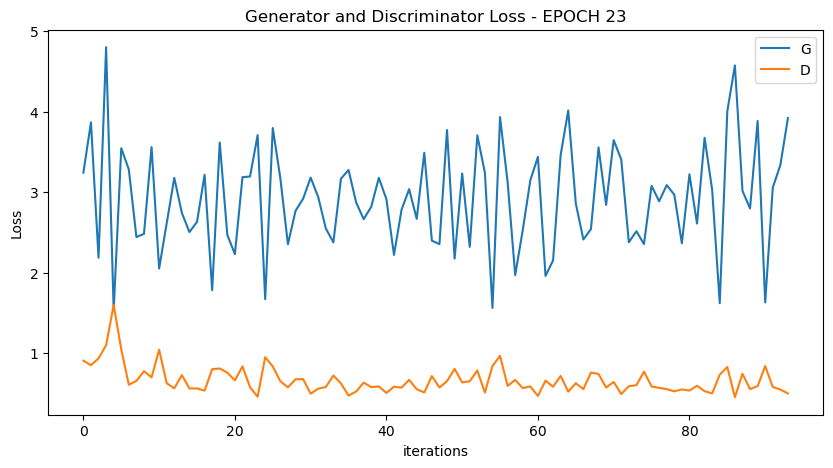

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:23,  1.79s/it]

[25/100][47/94] Loss_D: 0.7204 Loss_G: 1.8363 D(x): 0.5938 D(G(z)): 0.0760 / 0.1722


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:48<00:00,  1.80s/it]

[25/100][94/94] Loss_D: 0.7110 Loss_G: 2.8982 D(x): 0.5547 D(G(z)): 0.0140 / 0.0739


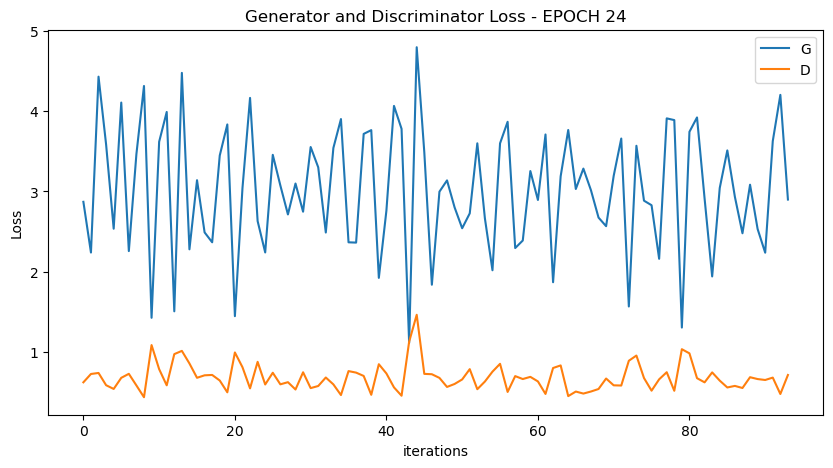

 50%|█████████████████████████████████████████                                         | 47/94 [01:25<01:32,  1.97s/it]

[26/100][47/94] Loss_D: 0.5048 Loss_G: 3.2510 D(x): 0.9168 D(G(z)): 0.1215 / 0.0349


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:07<00:00,  1.99s/it]

[26/100][94/94] Loss_D: 0.4298 Loss_G: 3.5147 D(x): 0.7605 D(G(z)): 0.0274 / 0.0209


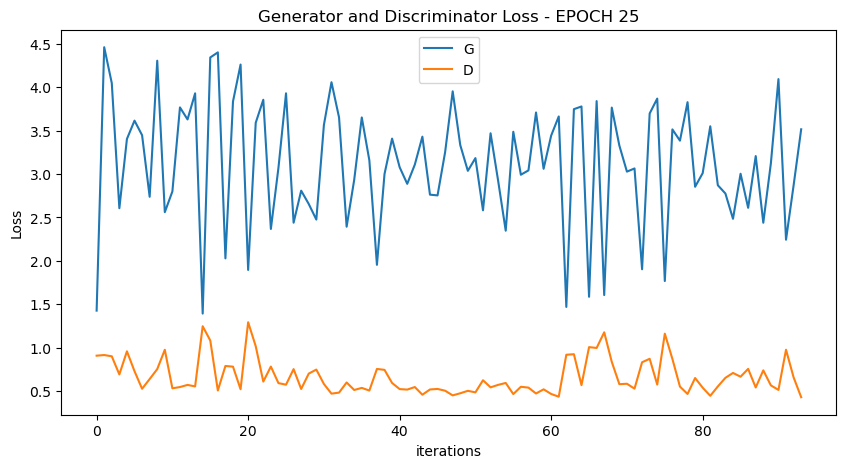

 50%|█████████████████████████████████████████                                         | 47/94 [01:33<01:28,  1.88s/it]

[27/100][47/94] Loss_D: 0.4999 Loss_G: 2.9039 D(x): 0.8754 D(G(z)): 0.1081 / 0.0496


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:02<00:00,  1.94s/it]

[27/100][94/94] Loss_D: 0.6150 Loss_G: 4.1183 D(x): 0.7204 D(G(z)): 0.1158 / 0.1209


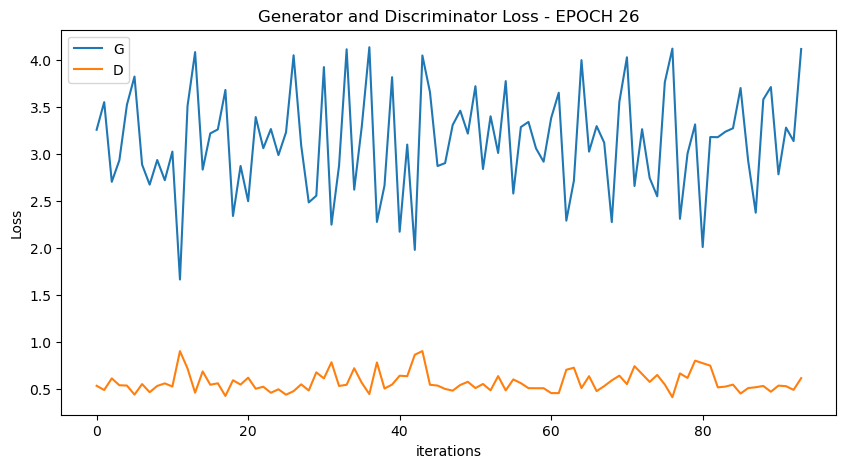

 50%|█████████████████████████████████████████                                         | 47/94 [01:28<01:27,  1.87s/it]

[28/100][47/94] Loss_D: 0.4595 Loss_G: 3.4008 D(x): 0.8493 D(G(z)): 0.0766 / 0.0291


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:55<00:00,  1.87s/it]

[28/100][94/94] Loss_D: 0.6142 Loss_G: 3.5025 D(x): 0.7384 D(G(z)): 0.0887 / 0.0266


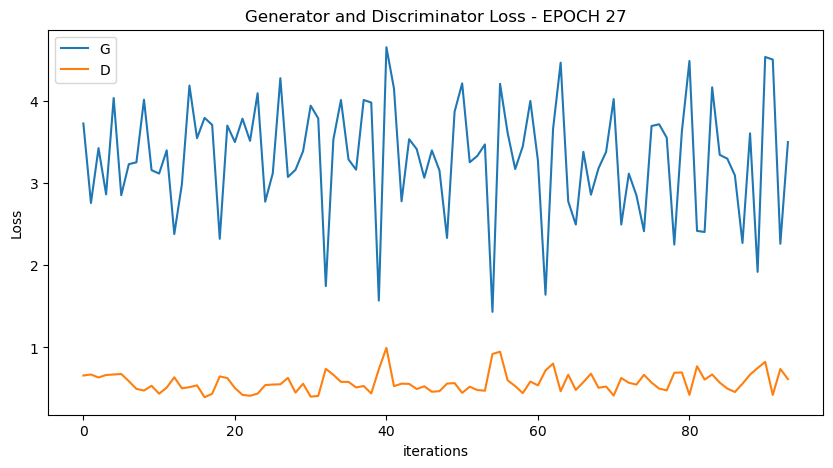

 50%|█████████████████████████████████████████                                         | 47/94 [01:26<01:26,  1.83s/it]

[29/100][47/94] Loss_D: 0.7151 Loss_G: 4.3524 D(x): 0.9298 D(G(z)): 0.2718 / 0.0118


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:48<00:00,  1.79s/it]

[29/100][94/94] Loss_D: 1.7440 Loss_G: 0.9264 D(x): 0.2433 D(G(z)): 0.0605 / 0.4588


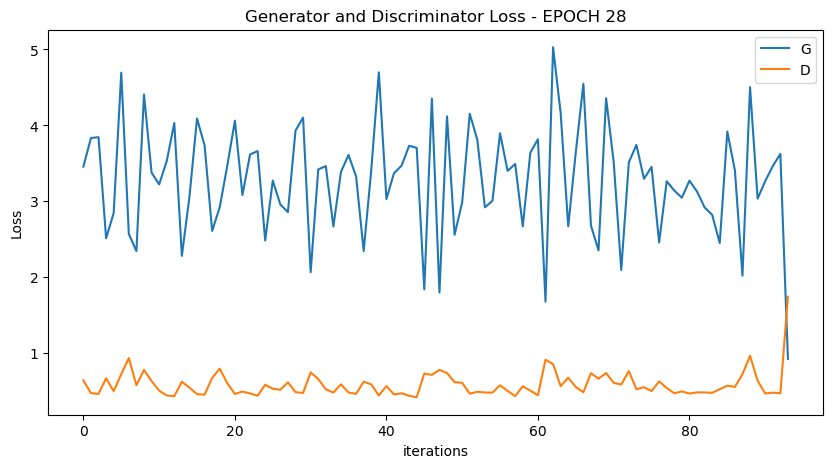

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[30/100][47/94] Loss_D: 0.4589 Loss_G: 3.2698 D(x): 0.8067 D(G(z)): 0.0411 / 0.0341


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[30/100][94/94] Loss_D: 1.1213 Loss_G: 1.8261 D(x): 0.3395 D(G(z)): 0.0339 / 0.1642


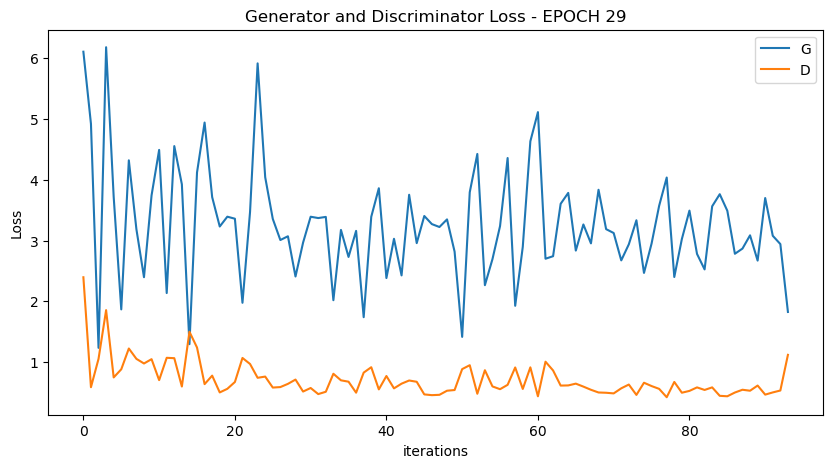

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.77s/it]

[31/100][47/94] Loss_D: 0.6486 Loss_G: 3.2155 D(x): 0.8870 D(G(z)): 0.2211 / 0.0333


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:46<00:00,  1.77s/it]

[31/100][94/94] Loss_D: 0.4244 Loss_G: 3.2894 D(x): 0.7765 D(G(z)): 0.0252 / 0.0277


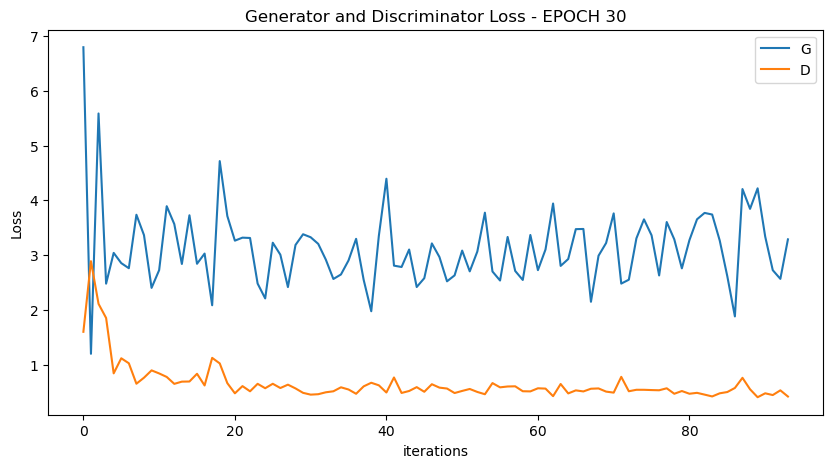

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


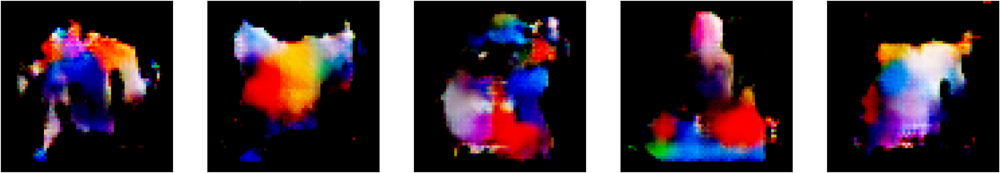

 50%|█████████████████████████████████████████                                         | 47/94 [01:35<01:38,  2.10s/it]

[32/100][47/94] Loss_D: 0.4766 Loss_G: 3.8508 D(x): 0.7815 D(G(z)): 0.0233 / 0.0217


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:02<00:00,  1.94s/it]

[32/100][94/94] Loss_D: 0.3576 Loss_G: 4.5914 D(x): 0.8643 D(G(z)): 0.0238 / 0.0064


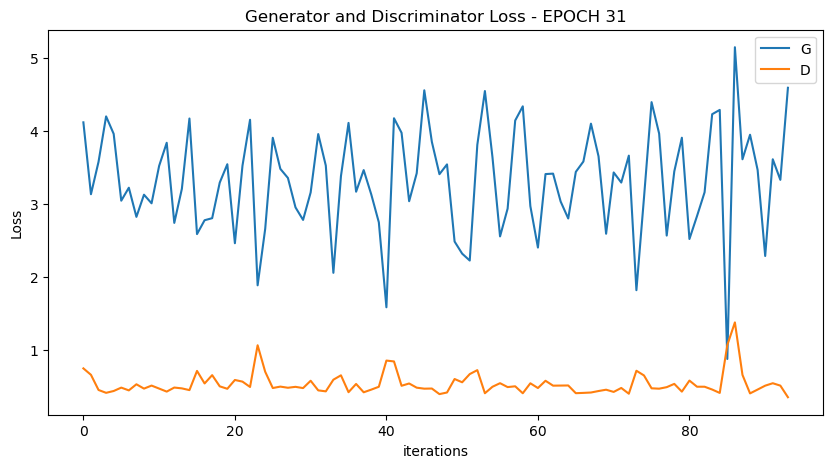

 50%|█████████████████████████████████████████                                         | 47/94 [01:14<01:15,  1.61s/it]

[33/100][47/94] Loss_D: 0.5030 Loss_G: 3.1285 D(x): 0.7907 D(G(z)): 0.0861 / 0.0457


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:34<00:00,  1.65s/it]

[33/100][94/94] Loss_D: 1.2763 Loss_G: 2.6194 D(x): 0.3288 D(G(z)): 0.0054 / 0.0825


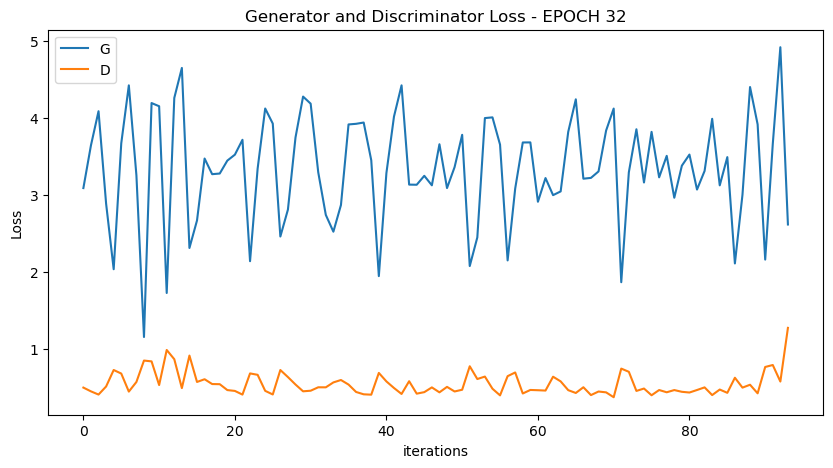

 50%|█████████████████████████████████████████                                         | 47/94 [01:16<01:22,  1.75s/it]

[34/100][47/94] Loss_D: 0.4805 Loss_G: 3.1707 D(x): 0.7918 D(G(z)): 0.0471 / 0.0423


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:38<00:00,  1.68s/it]

[34/100][94/94] Loss_D: 0.7777 Loss_G: 2.2020 D(x): 0.4859 D(G(z)): 0.0326 / 0.1112


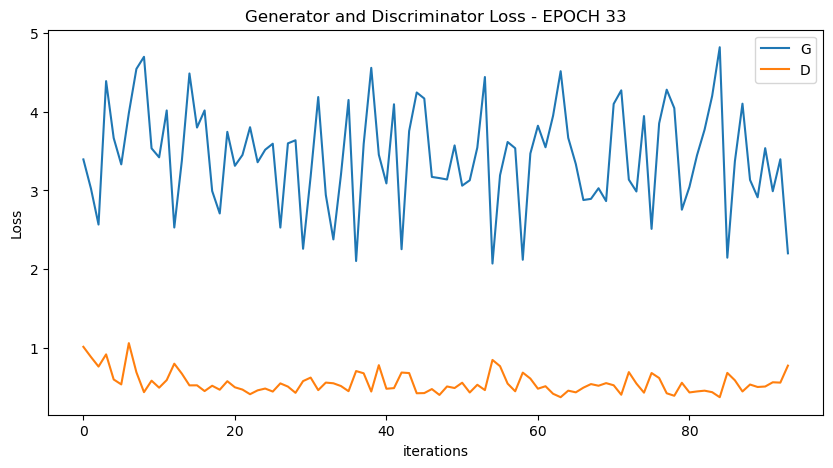

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.77s/it]

[35/100][47/94] Loss_D: 0.5434 Loss_G: 4.9262 D(x): 0.9496 D(G(z)): 0.1118 / 0.0076


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[35/100][94/94] Loss_D: 0.4547 Loss_G: 4.1153 D(x): 0.7938 D(G(z)): 0.0623 / 0.0205


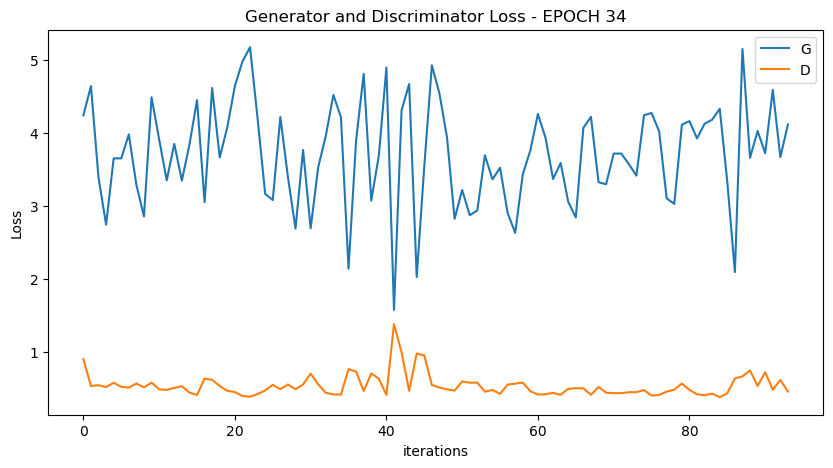

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.78s/it]

[36/100][47/94] Loss_D: 0.4025 Loss_G: 3.8252 D(x): 0.8831 D(G(z)): 0.0390 / 0.0200


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[36/100][94/94] Loss_D: 1.0367 Loss_G: 1.7539 D(x): 0.3553 D(G(z)): 0.0288 / 0.2401


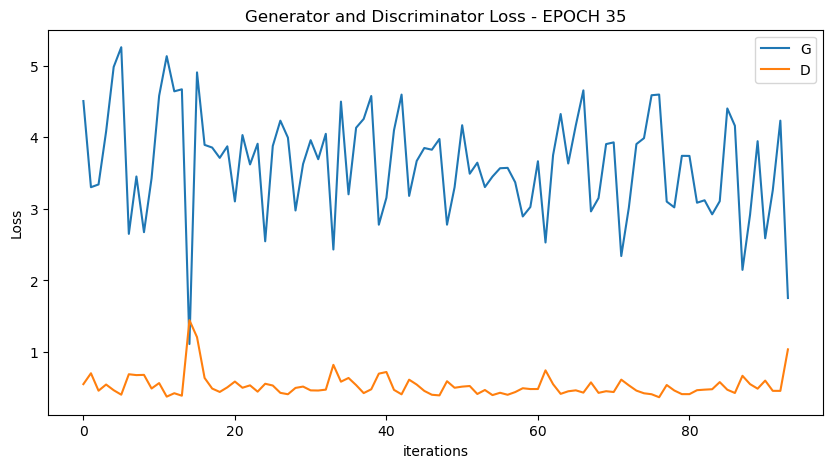

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:21,  1.74s/it]

[37/100][47/94] Loss_D: 0.4034 Loss_G: 4.5976 D(x): 0.8610 D(G(z)): 0.0209 / 0.0099


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:46<00:00,  1.77s/it]

[37/100][94/94] Loss_D: 1.4199 Loss_G: 1.4239 D(x): 0.2879 D(G(z)): 0.0445 / 0.2408


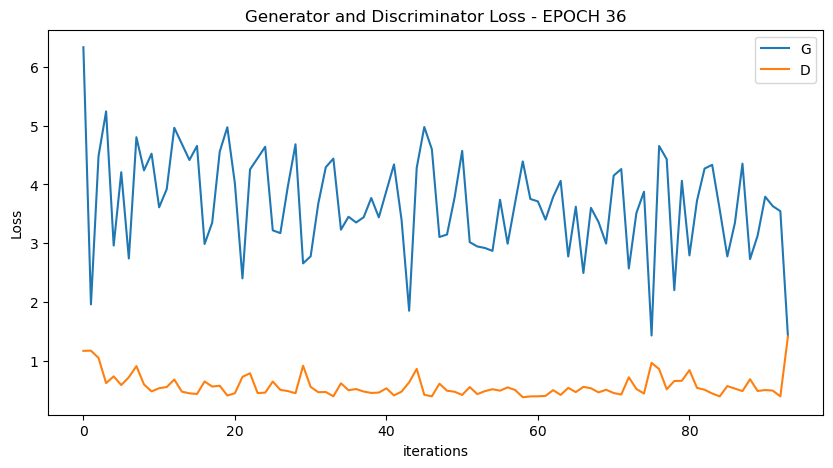

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:23,  1.77s/it]

[38/100][47/94] Loss_D: 0.8169 Loss_G: 3.7094 D(x): 0.9912 D(G(z)): 0.2291 / 0.0229


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[38/100][94/94] Loss_D: 1.5234 Loss_G: 1.9332 D(x): 0.3025 D(G(z)): 0.0483 / 0.2282


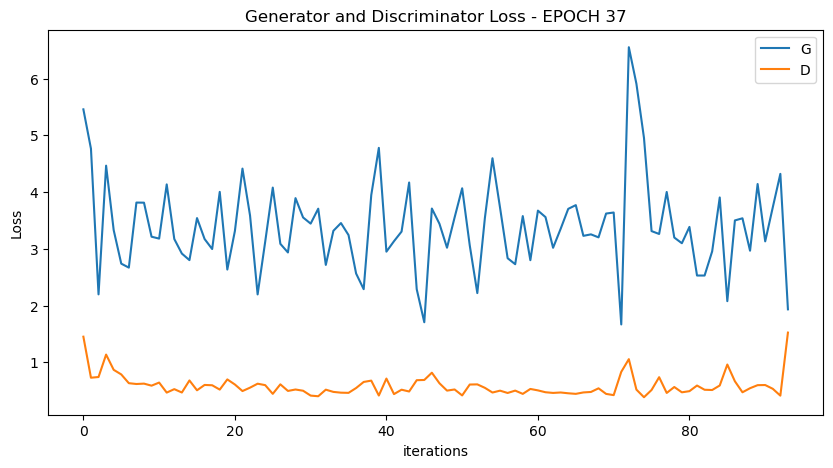

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.78s/it]

[39/100][47/94] Loss_D: 0.5300 Loss_G: 2.9631 D(x): 0.7094 D(G(z)): 0.0302 / 0.0482


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[39/100][94/94] Loss_D: 0.8429 Loss_G: 6.8783 D(x): 0.9914 D(G(z)): 0.2006 / 0.0010


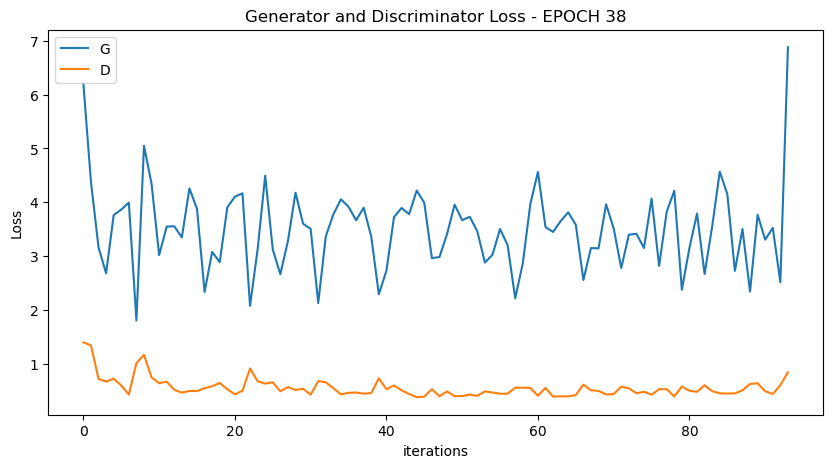

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[40/100][47/94] Loss_D: 0.4739 Loss_G: 3.7498 D(x): 0.7627 D(G(z)): 0.0202 / 0.0230


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[40/100][94/94] Loss_D: 0.9291 Loss_G: 2.2507 D(x): 0.4152 D(G(z)): 0.0239 / 0.1260


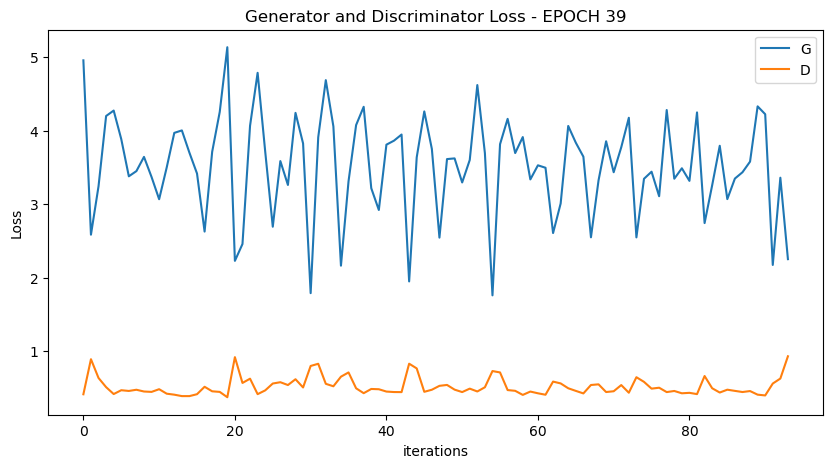

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:24,  1.79s/it]

[41/100][47/94] Loss_D: 0.4692 Loss_G: 4.0739 D(x): 0.9656 D(G(z)): 0.0457 / 0.0144


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:46<00:00,  1.78s/it]

[41/100][94/94] Loss_D: 2.0813 Loss_G: 0.5771 D(x): 0.1178 D(G(z)): 0.0330 / 0.6874


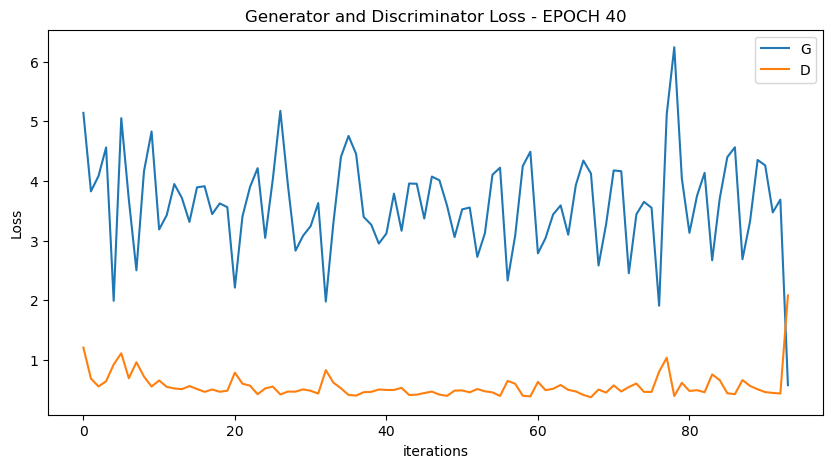

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


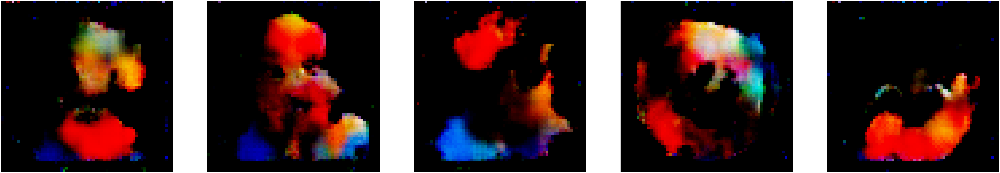

 50%|█████████████████████████████████████████                                         | 47/94 [01:54<01:32,  1.97s/it]

[42/100][47/94] Loss_D: 0.4506 Loss_G: 4.0135 D(x): 0.8912 D(G(z)): 0.0715 / 0.0183


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:27<00:00,  2.21s/it]

[42/100][94/94] Loss_D: 0.4266 Loss_G: 6.0074 D(x): 0.9818 D(G(z)): 0.0057 / 0.0020


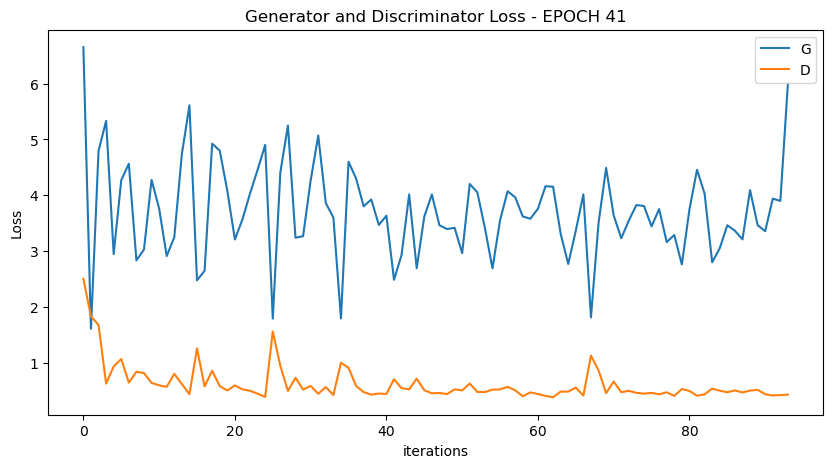

 50%|█████████████████████████████████████████                                         | 47/94 [01:24<01:24,  1.80s/it]

[43/100][47/94] Loss_D: 0.3812 Loss_G: 4.2595 D(x): 0.9053 D(G(z)): 0.0249 / 0.0120


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:47<00:00,  1.78s/it]

[43/100][94/94] Loss_D: 0.8748 Loss_G: 5.2537 D(x): 0.7938 D(G(z)): 0.1961 / 0.0138


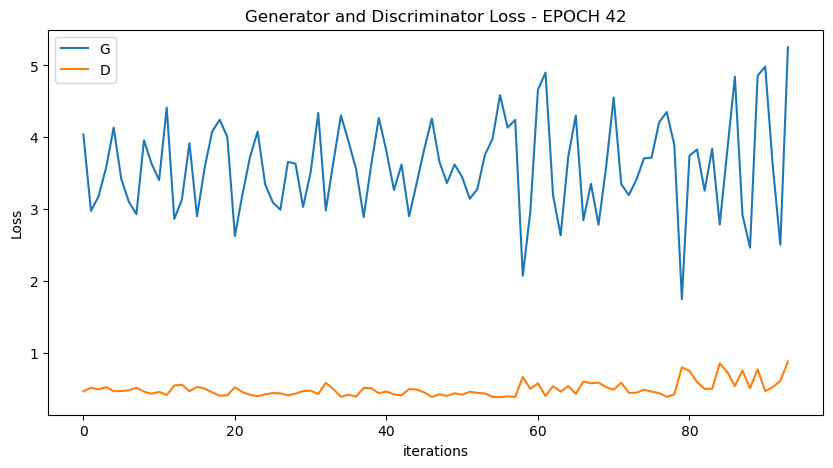

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[44/100][47/94] Loss_D: 0.4113 Loss_G: 4.0549 D(x): 0.8068 D(G(z)): 0.0202 / 0.0188


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[44/100][94/94] Loss_D: 0.3883 Loss_G: 4.2437 D(x): 0.8435 D(G(z)): 0.0305 / 0.0093


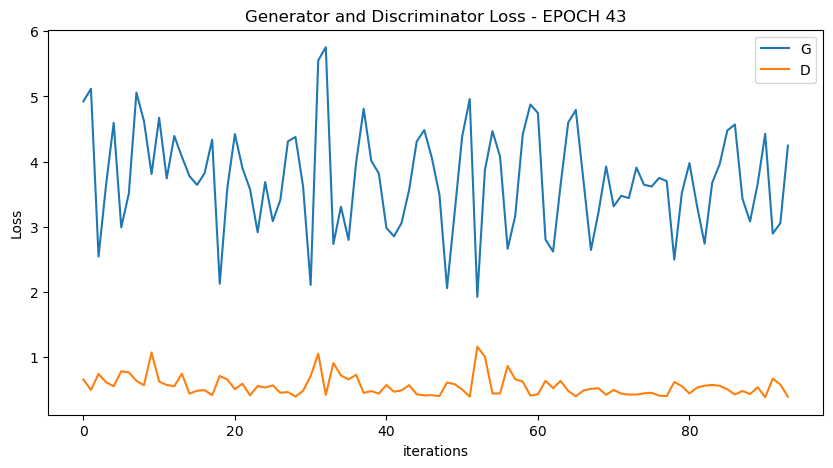

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:21,  1.74s/it]

[45/100][47/94] Loss_D: 0.5395 Loss_G: 3.1911 D(x): 0.9603 D(G(z)): 0.1353 / 0.0392


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:32<00:00,  1.62s/it]

[45/100][94/94] Loss_D: 0.5094 Loss_G: 4.1871 D(x): 0.9831 D(G(z)): 0.0492 / 0.0099


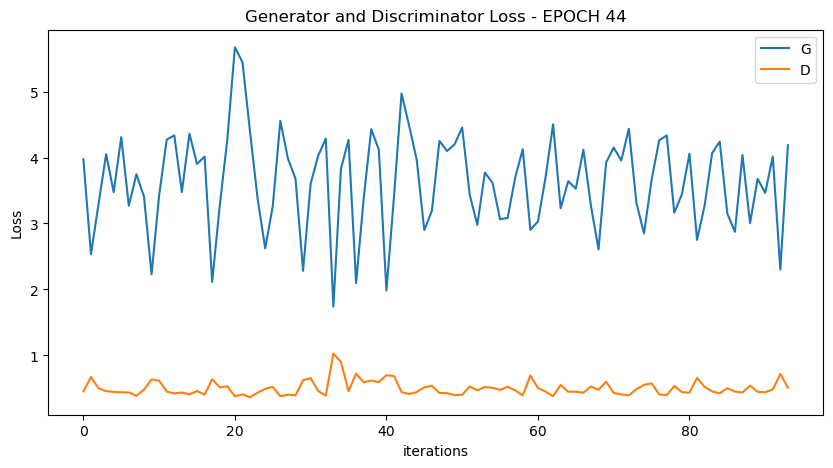

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.50s/it]

[46/100][47/94] Loss_D: 0.4966 Loss_G: 4.3090 D(x): 0.8511 D(G(z)): 0.0778 / 0.0105


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.52s/it]

[46/100][94/94] Loss_D: 0.6383 Loss_G: 6.0439 D(x): 0.9968 D(G(z)): 0.0230 / 0.0014


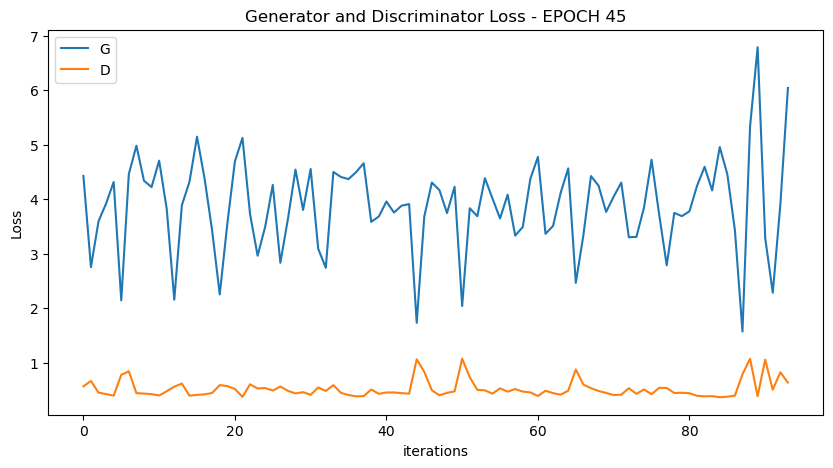

 50%|█████████████████████████████████████████                                         | 47/94 [01:14<01:11,  1.52s/it]

[47/100][47/94] Loss_D: 0.5284 Loss_G: 3.5528 D(x): 0.9738 D(G(z)): 0.0889 / 0.0240


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.53s/it]

[47/100][94/94] Loss_D: 0.4636 Loss_G: 4.2236 D(x): 0.7698 D(G(z)): 0.0243 / 0.0116


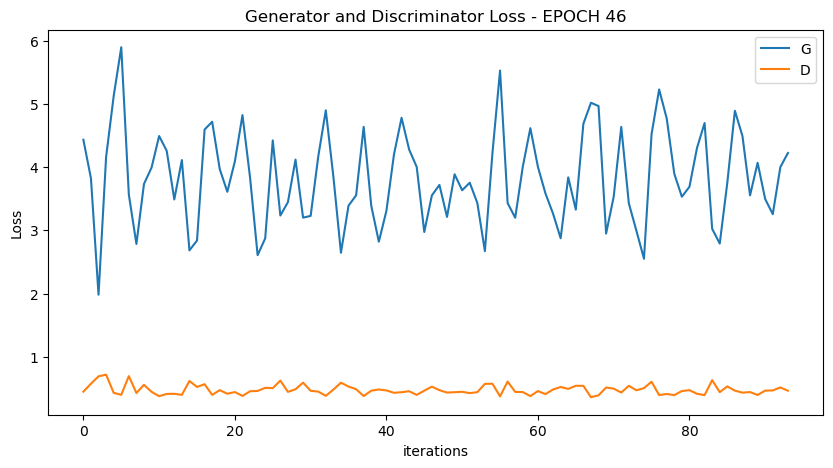

 50%|█████████████████████████████████████████                                         | 47/94 [01:13<01:12,  1.54s/it]

[48/100][47/94] Loss_D: 0.5150 Loss_G: 3.4163 D(x): 0.7591 D(G(z)): 0.0253 / 0.0313


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.53s/it]

[48/100][94/94] Loss_D: 0.3536 Loss_G: 4.7049 D(x): 0.8957 D(G(z)): 0.0115 / 0.0057


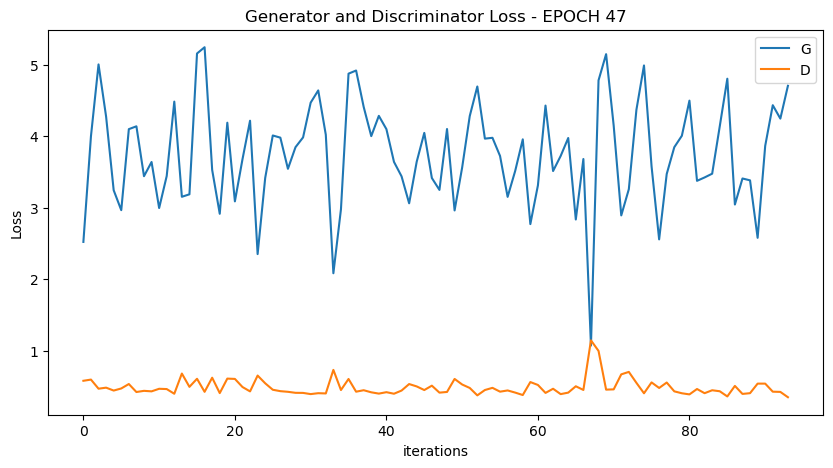

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.50s/it]

[49/100][47/94] Loss_D: 0.4159 Loss_G: 4.2064 D(x): 0.9291 D(G(z)): 0.0471 / 0.0131


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[49/100][94/94] Loss_D: 0.4429 Loss_G: 5.1937 D(x): 0.9704 D(G(z)): 0.0555 / 0.0065


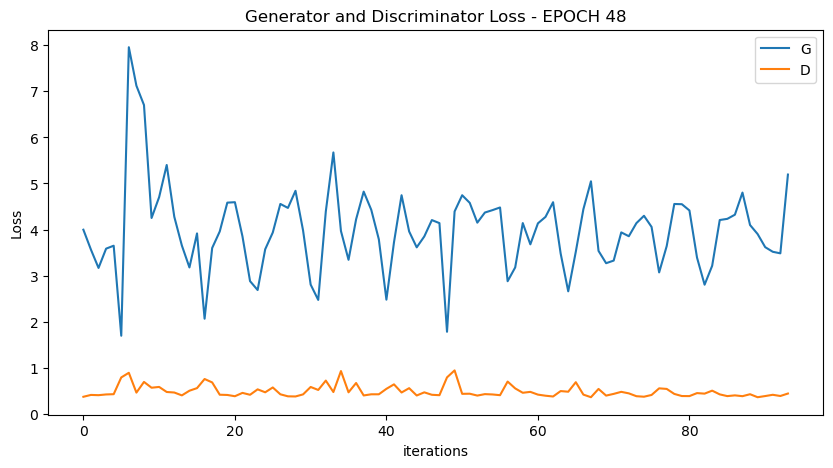

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:12,  1.53s/it]

[50/100][47/94] Loss_D: 0.6980 Loss_G: 1.9424 D(x): 0.5531 D(G(z)): 0.0306 / 0.1662


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.53s/it]

[50/100][94/94] Loss_D: 0.8320 Loss_G: 1.3861 D(x): 0.4436 D(G(z)): 0.0333 / 0.2747


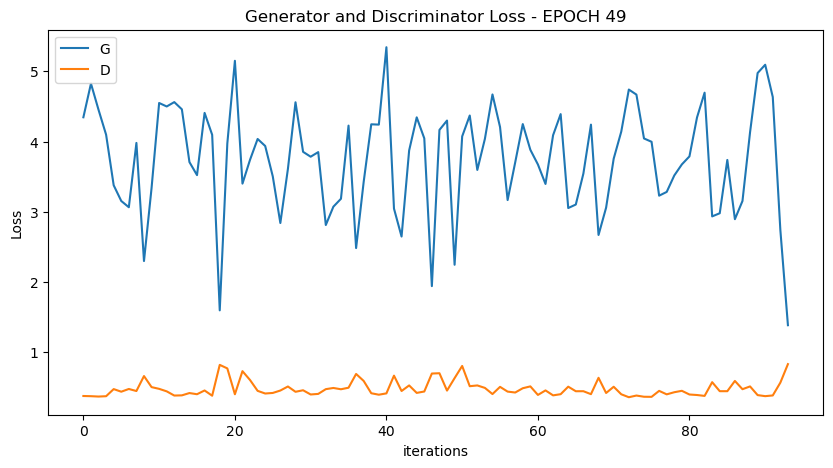

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.50s/it]

[51/100][47/94] Loss_D: 0.5420 Loss_G: 3.0353 D(x): 0.7994 D(G(z)): 0.1115 / 0.0489


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.53s/it]

[51/100][94/94] Loss_D: 0.6642 Loss_G: 7.5852 D(x): 0.9856 D(G(z)): 0.1610 / 0.0016


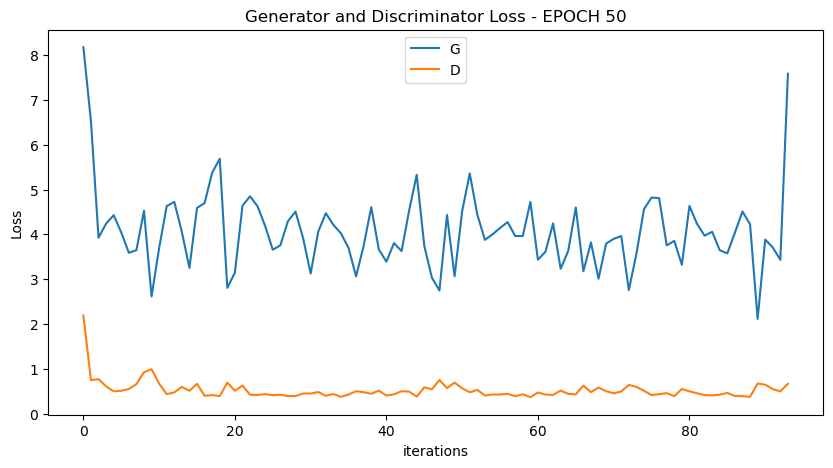

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


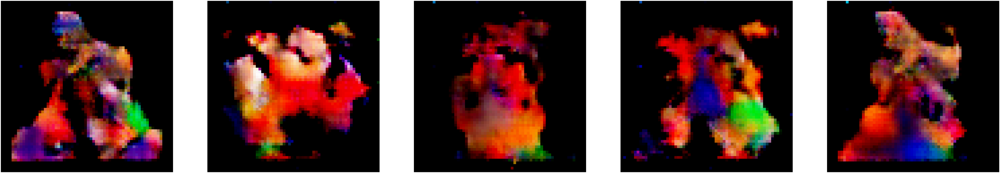

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:09,  1.47s/it]

[52/100][47/94] Loss_D: 0.4580 Loss_G: 3.5922 D(x): 0.8506 D(G(z)): 0.0631 / 0.0237


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.51s/it]

[52/100][94/94] Loss_D: 0.4641 Loss_G: 4.6494 D(x): 0.9854 D(G(z)): 0.0156 / 0.0060


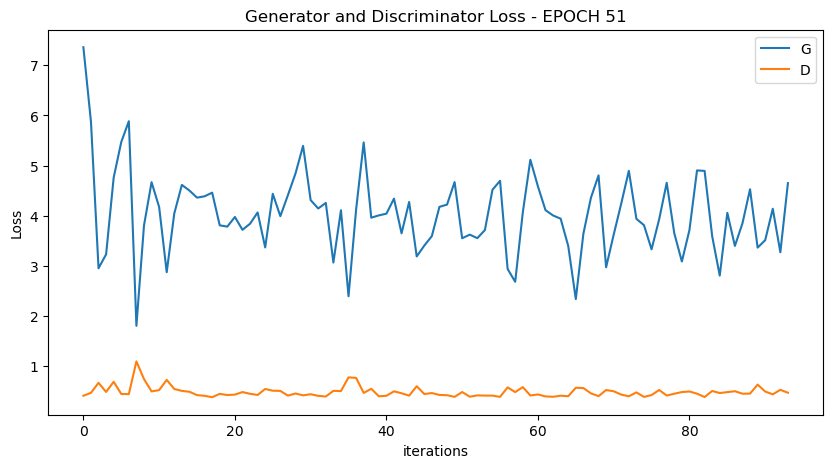

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:15,  1.60s/it]

[53/100][47/94] Loss_D: 0.3931 Loss_G: 4.9313 D(x): 0.8239 D(G(z)): 0.0140 / 0.0080


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[53/100][94/94] Loss_D: 0.7337 Loss_G: 3.1225 D(x): 0.5405 D(G(z)): 0.0612 / 0.0372


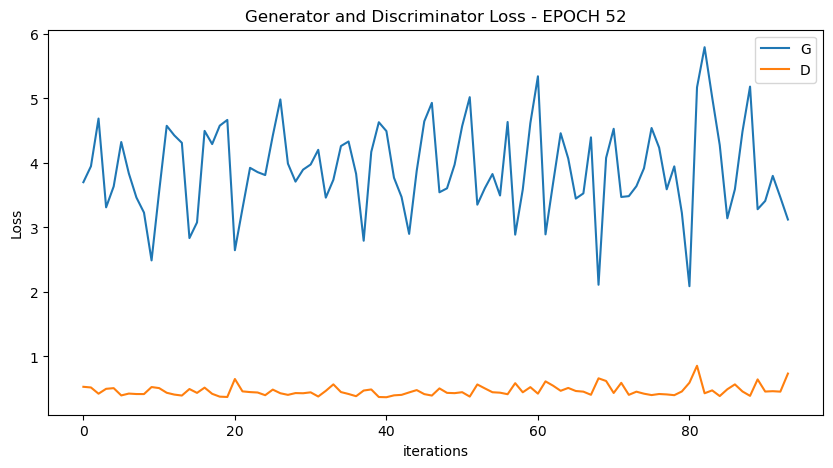

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:09,  1.48s/it]

[54/100][47/94] Loss_D: 0.4259 Loss_G: 3.6353 D(x): 0.8975 D(G(z)): 0.0642 / 0.0234


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:20<00:00,  1.50s/it]

[54/100][94/94] Loss_D: 0.6773 Loss_G: 4.7841 D(x): 0.6236 D(G(z)): 0.1082 / 0.0627


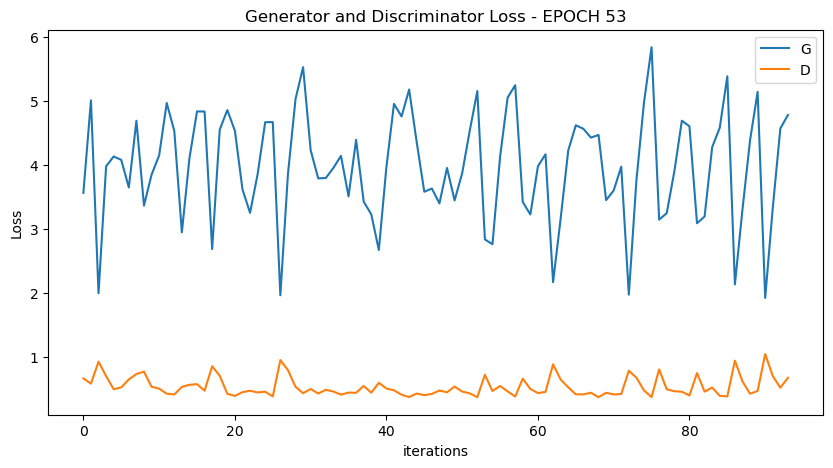

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:12,  1.54s/it]

[55/100][47/94] Loss_D: 0.4995 Loss_G: 4.1731 D(x): 0.9123 D(G(z)): 0.1170 / 0.0141


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [06:32<00:00,  4.18s/it]

[55/100][94/94] Loss_D: 1.4251 Loss_G: 2.4891 D(x): 0.2483 D(G(z)): 0.0040 / 0.2412


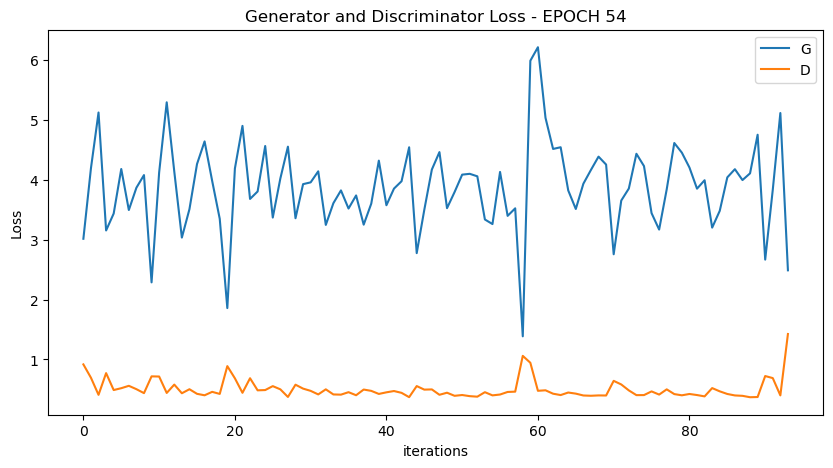

 50%|█████████████████████████████████████████                                         | 47/94 [02:01<01:54,  2.43s/it]

[56/100][47/94] Loss_D: 0.4323 Loss_G: 5.0186 D(x): 0.9666 D(G(z)): 0.0297 / 0.0076


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:35<00:00,  2.29s/it]

[56/100][94/94] Loss_D: 0.3711 Loss_G: 4.4152 D(x): 0.9575 D(G(z)): 0.0051 / 0.0082


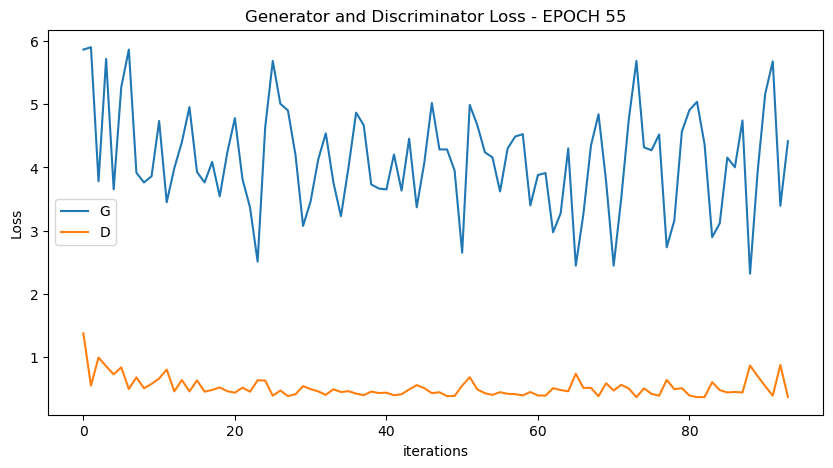

 50%|█████████████████████████████████████████                                         | 47/94 [01:04<01:08,  1.47s/it]

[57/100][47/94] Loss_D: 0.4431 Loss_G: 3.6136 D(x): 0.7664 D(G(z)): 0.0140 / 0.0265


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:14<00:00,  1.43s/it]

[57/100][94/94] Loss_D: 1.9485 Loss_G: 1.3673 D(x): 0.1817 D(G(z)): 0.0262 / 0.3777


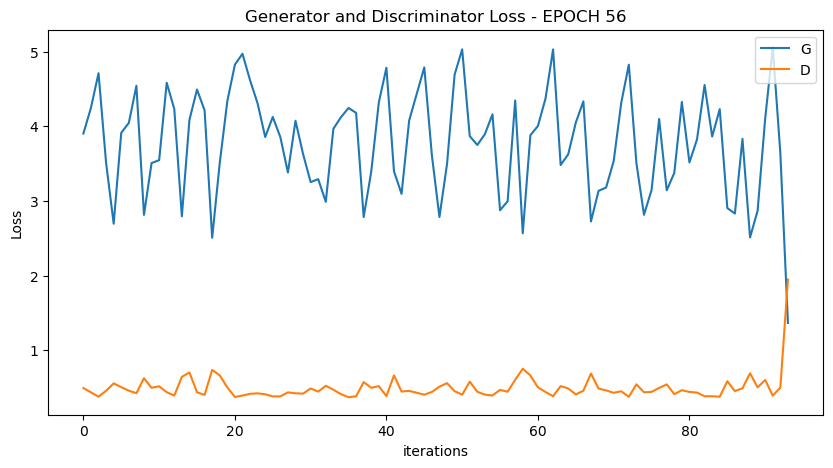

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:13,  1.56s/it]

[58/100][47/94] Loss_D: 0.4151 Loss_G: 3.4321 D(x): 0.8672 D(G(z)): 0.0518 / 0.0273


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:32<00:00,  1.62s/it]

[58/100][94/94] Loss_D: 0.5091 Loss_G: 4.2184 D(x): 0.7179 D(G(z)): 0.0522 / 0.0138


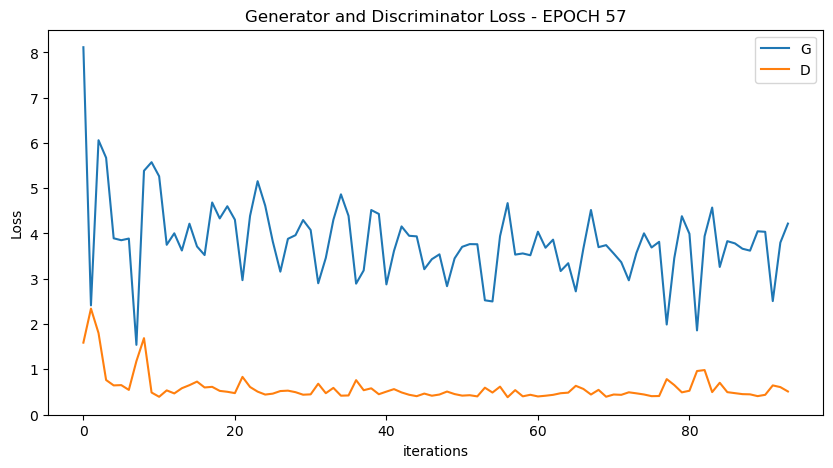

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:12,  1.53s/it]

[59/100][47/94] Loss_D: 0.4434 Loss_G: 3.6784 D(x): 0.7651 D(G(z)): 0.0200 / 0.0236


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.52s/it]

[59/100][94/94] Loss_D: 0.4203 Loss_G: 4.5751 D(x): 0.8843 D(G(z)): 0.0754 / 0.0070


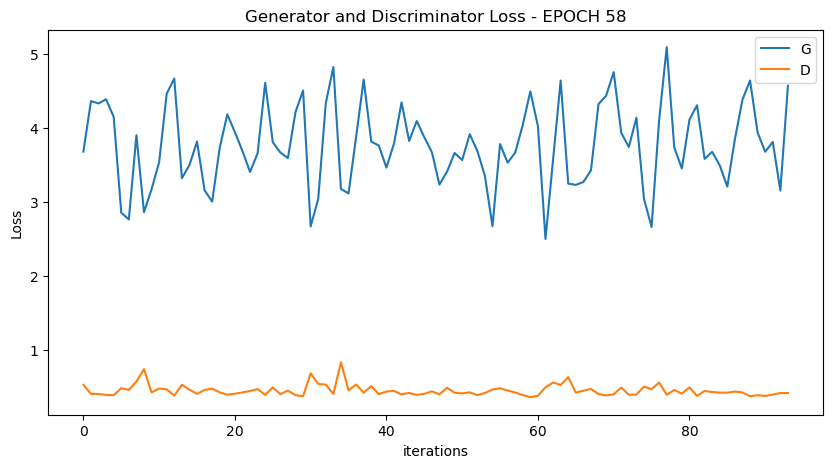

 50%|█████████████████████████████████████████                                         | 47/94 [01:13<01:16,  1.63s/it]

[60/100][47/94] Loss_D: 0.4289 Loss_G: 3.8429 D(x): 0.8022 D(G(z)): 0.0156 / 0.0184


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:34<00:00,  1.64s/it]

[60/100][94/94] Loss_D: 0.5134 Loss_G: 5.1993 D(x): 0.9833 D(G(z)): 0.0281 / 0.0032


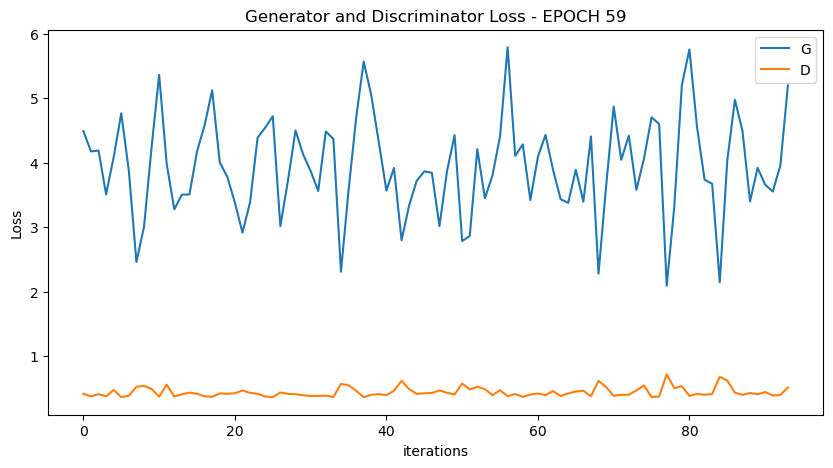

 50%|█████████████████████████████████████████                                         | 47/94 [01:27<01:26,  1.85s/it]

[61/100][47/94] Loss_D: 0.4532 Loss_G: 3.8320 D(x): 0.8879 D(G(z)): 0.0829 / 0.0195


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:49<00:00,  1.81s/it]

[61/100][94/94] Loss_D: 0.6979 Loss_G: 2.0074 D(x): 0.5337 D(G(z)): 0.0168 / 0.2041


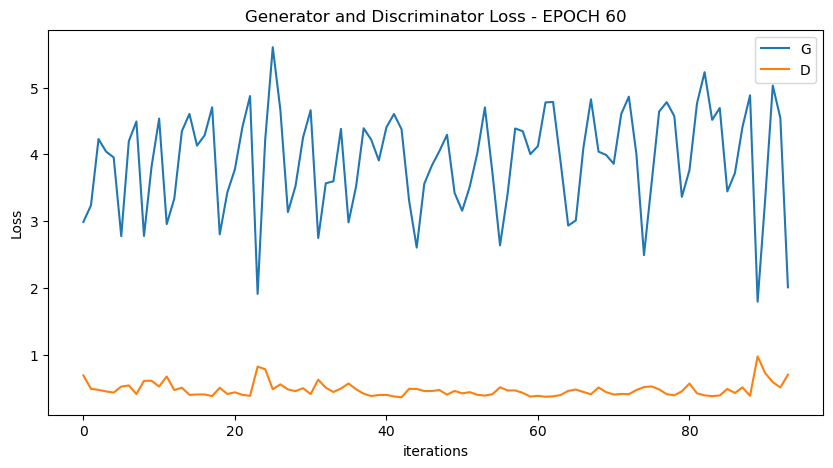

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


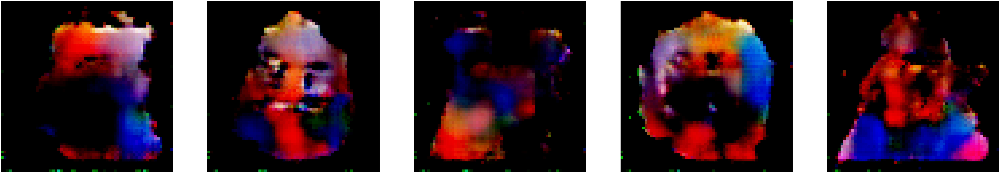

 50%|█████████████████████████████████████████                                         | 47/94 [02:20<01:25,  1.81s/it]

[62/100][47/94] Loss_D: 0.9678 Loss_G: 2.1023 D(x): 0.4456 D(G(z)): 0.0132 / 0.1793


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [03:53<00:00,  2.49s/it]

[62/100][94/94] Loss_D: 0.5846 Loss_G: 3.8121 D(x): 0.6006 D(G(z)): 0.0072 / 0.0190


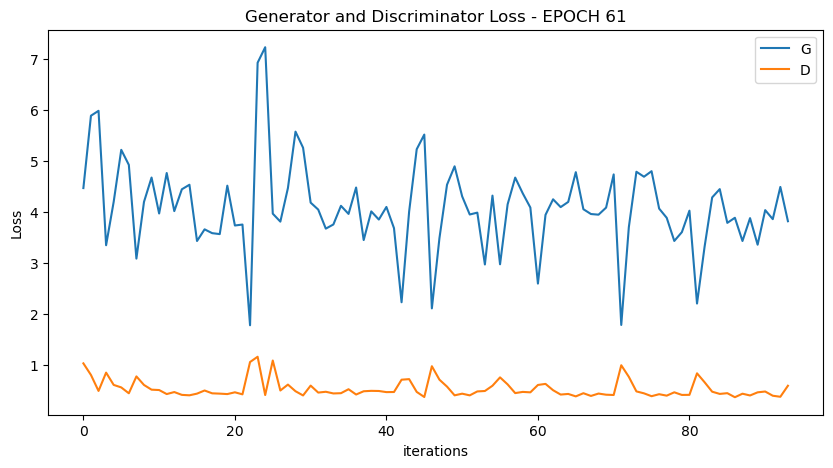

 50%|█████████████████████████████████████████                                         | 47/94 [01:15<01:21,  1.73s/it]

[63/100][47/94] Loss_D: 0.4570 Loss_G: 5.6439 D(x): 0.9631 D(G(z)): 0.0512 / 0.0059


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:30<00:00,  1.60s/it]

[63/100][94/94] Loss_D: 0.9258 Loss_G: 3.8683 D(x): 0.4303 D(G(z)): 0.0042 / 0.0148


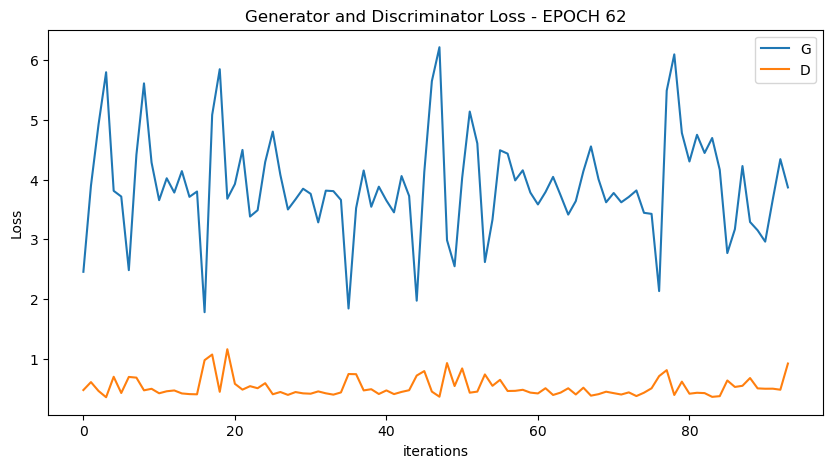

 50%|█████████████████████████████████████████                                         | 47/94 [01:18<01:16,  1.62s/it]

[64/100][47/94] Loss_D: 0.3844 Loss_G: 4.9316 D(x): 0.8480 D(G(z)): 0.0074 / 0.0056


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:50<00:00,  1.81s/it]

[64/100][94/94] Loss_D: 0.5615 Loss_G: 3.5036 D(x): 0.6089 D(G(z)): 0.0111 / 0.0735


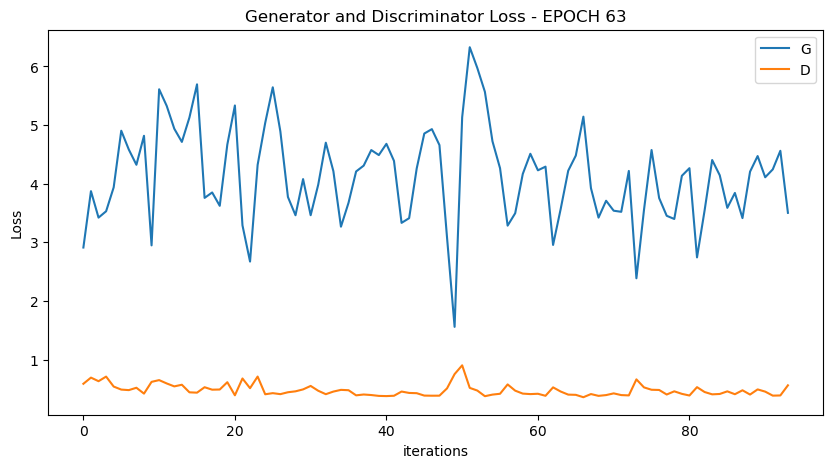

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:16,  1.64s/it]

[65/100][47/94] Loss_D: 0.4343 Loss_G: 4.4274 D(x): 0.8427 D(G(z)): 0.0427 / 0.0274


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[65/100][94/94] Loss_D: 0.3610 Loss_G: 5.3150 D(x): 0.8835 D(G(z)): 0.0274 / 0.0031


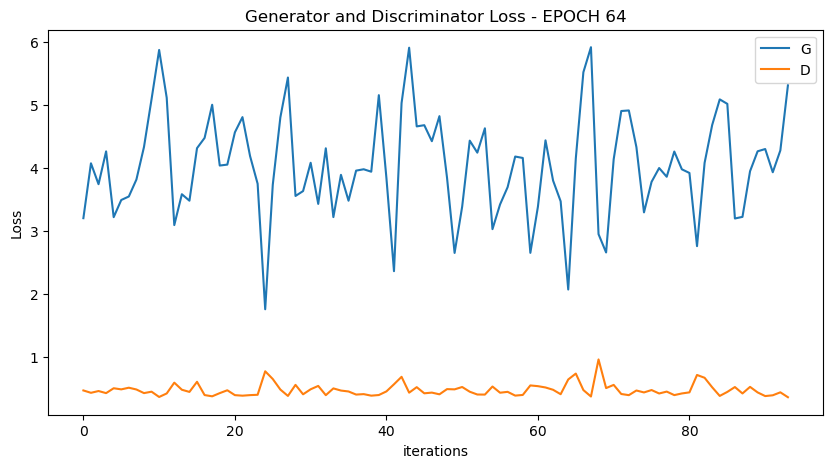

 50%|█████████████████████████████████████████                                         | 47/94 [01:15<01:17,  1.65s/it]

[66/100][47/94] Loss_D: 0.4451 Loss_G: 3.8099 D(x): 0.7549 D(G(z)): 0.0133 / 0.0226


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:30<00:00,  1.61s/it]

[66/100][94/94] Loss_D: 0.3413 Loss_G: 5.8112 D(x): 0.8984 D(G(z)): 0.0055 / 0.0022


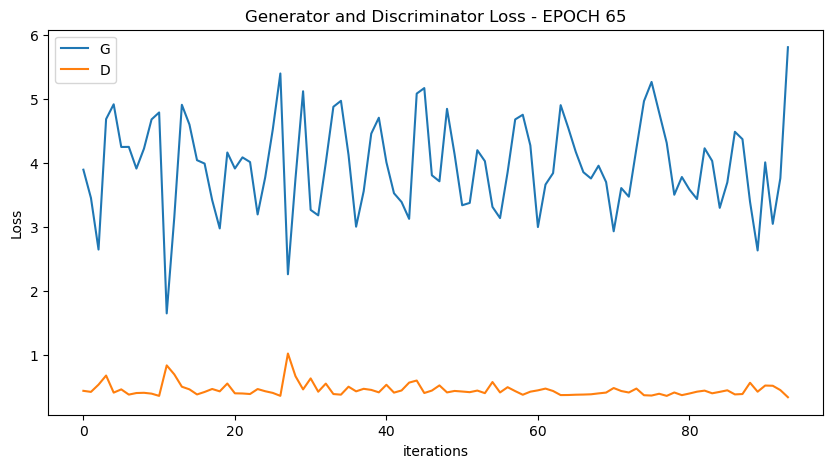

 50%|█████████████████████████████████████████                                         | 47/94 [01:16<01:30,  1.93s/it]

[67/100][47/94] Loss_D: 0.4216 Loss_G: 4.5083 D(x): 0.9424 D(G(z)): 0.0340 / 0.0091


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:36<00:00,  1.67s/it]

[67/100][94/94] Loss_D: 0.5190 Loss_G: 6.3525 D(x): 0.9919 D(G(z)): 0.0054 / 0.0016


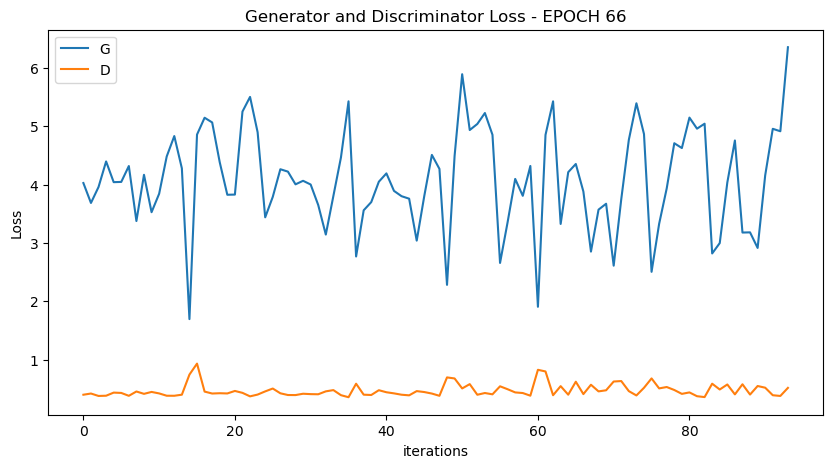

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:11,  1.52s/it]

[68/100][47/94] Loss_D: 0.5867 Loss_G: 3.3520 D(x): 0.6322 D(G(z)): 0.0105 / 0.0347


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:21<00:00,  1.51s/it]

[68/100][94/94] Loss_D: 0.5695 Loss_G: 6.8381 D(x): 0.9576 D(G(z)): 0.1858 / 0.0034


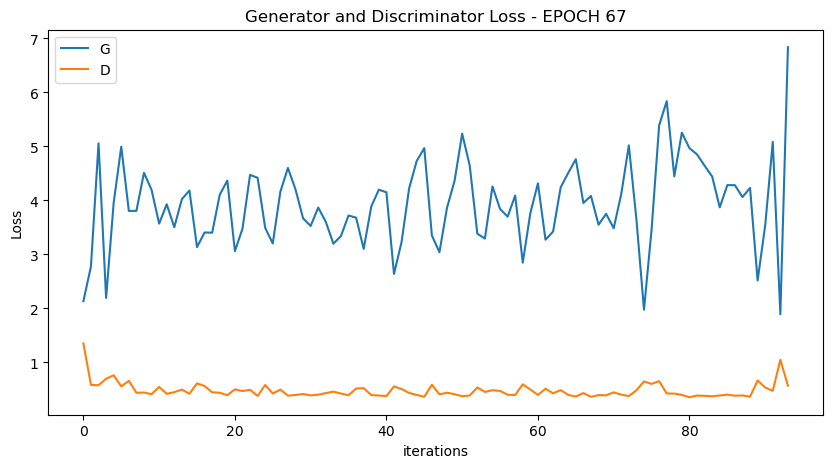

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:11,  1.51s/it]

[69/100][47/94] Loss_D: 0.3879 Loss_G: 3.8977 D(x): 0.9286 D(G(z)): 0.0269 / 0.0164


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.51s/it]

[69/100][94/94] Loss_D: 0.4587 Loss_G: 4.3076 D(x): 0.7165 D(G(z)): 0.0072 / 0.0112


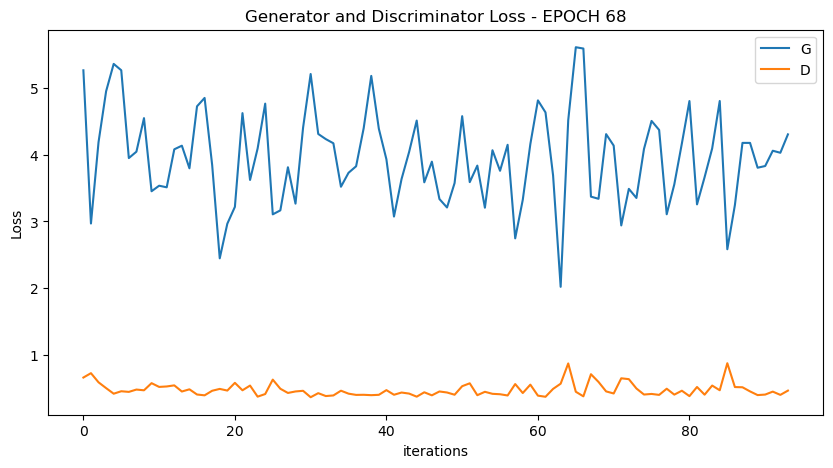

 50%|█████████████████████████████████████████                                         | 47/94 [01:10<01:11,  1.52s/it]

[70/100][47/94] Loss_D: 0.3892 Loss_G: 3.8944 D(x): 0.8505 D(G(z)): 0.0359 / 0.0184


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:27<00:00,  1.56s/it]

[70/100][94/94] Loss_D: 2.2788 Loss_G: 0.8010 D(x): 0.0859 D(G(z)): 0.0030 / 0.5524


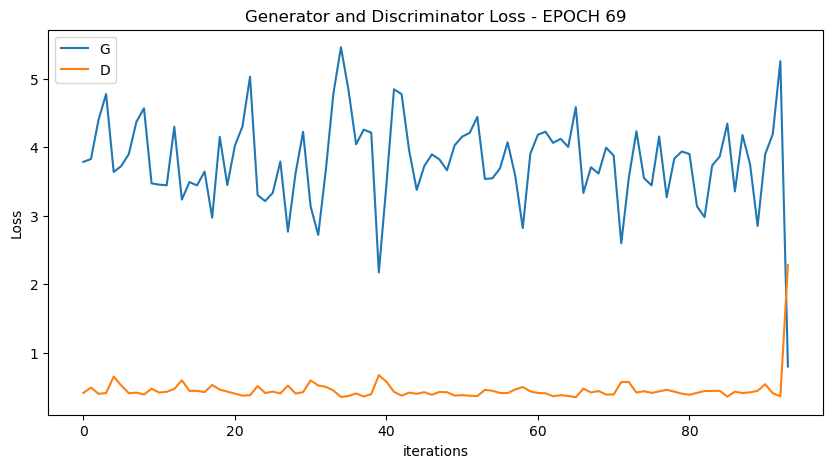

 50%|█████████████████████████████████████████                                         | 47/94 [01:19<01:15,  1.60s/it]

[71/100][47/94] Loss_D: 0.4725 Loss_G: 4.2951 D(x): 0.9596 D(G(z)): 0.0364 / 0.0112


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:34<00:00,  1.65s/it]

[71/100][94/94] Loss_D: 2.7266 Loss_G: 0.3982 D(x): 0.0544 D(G(z)): 0.0054 / 0.7604


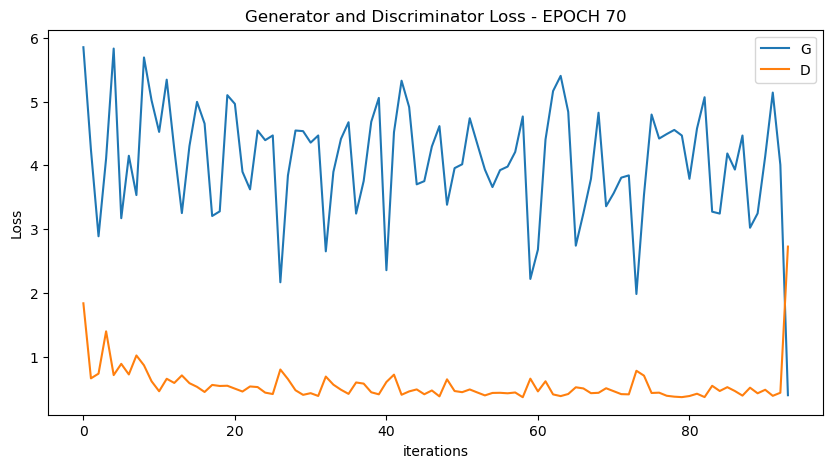

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


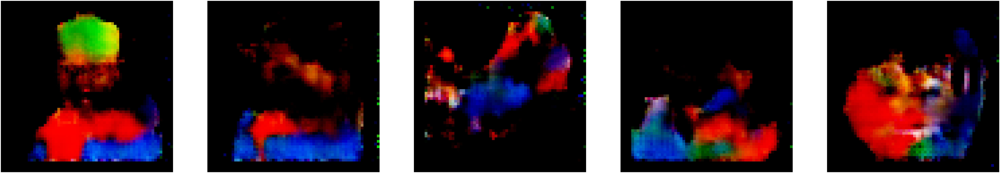

 50%|█████████████████████████████████████████                                         | 47/94 [01:10<01:12,  1.53s/it]

[72/100][47/94] Loss_D: 0.5657 Loss_G: 4.2647 D(x): 0.9794 D(G(z)): 0.1002 / 0.0121


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:20<00:00,  1.49s/it]

[72/100][94/94] Loss_D: 0.6934 Loss_G: 2.8005 D(x): 0.5642 D(G(z)): 0.0391 / 0.0642


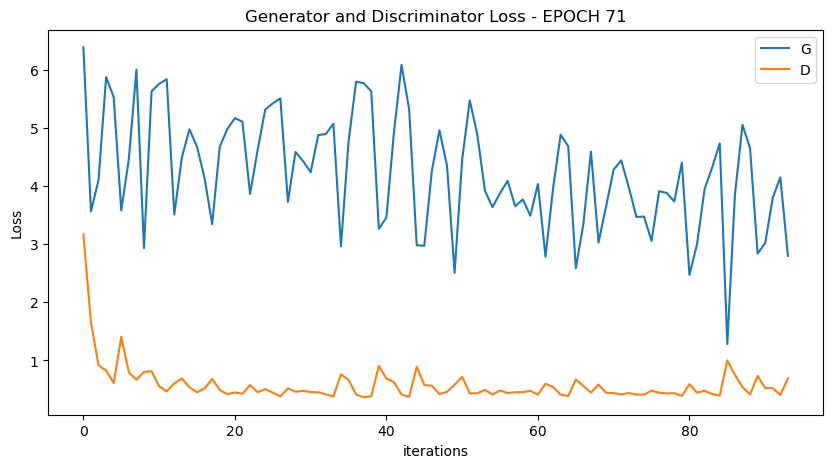

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.49s/it]

[73/100][47/94] Loss_D: 0.4886 Loss_G: 4.1712 D(x): 0.8444 D(G(z)): 0.1016 / 0.0148


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:24<00:00,  1.54s/it]

[73/100][94/94] Loss_D: 0.4549 Loss_G: 3.3583 D(x): 0.7471 D(G(z)): 0.0219 / 0.0264


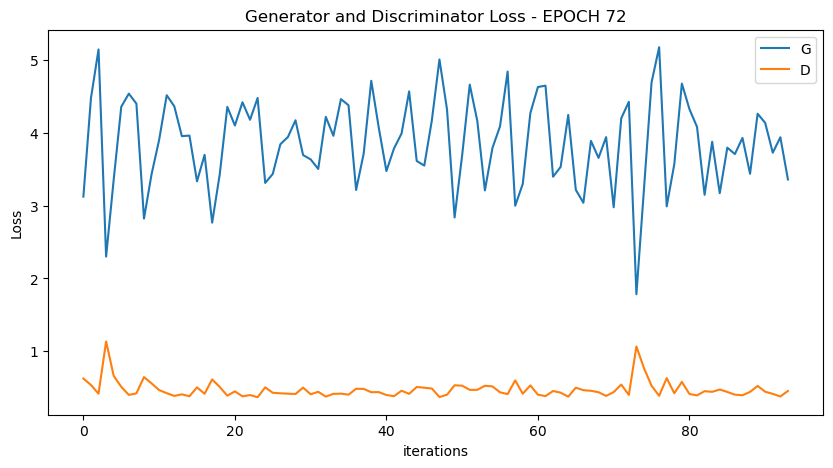

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:15,  1.61s/it]

[74/100][47/94] Loss_D: 0.4153 Loss_G: 3.5651 D(x): 0.8930 D(G(z)): 0.0576 / 0.0258


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:25<00:00,  1.54s/it]

[74/100][94/94] Loss_D: 0.3645 Loss_G: 4.4522 D(x): 0.9038 D(G(z)): 0.0111 / 0.0073


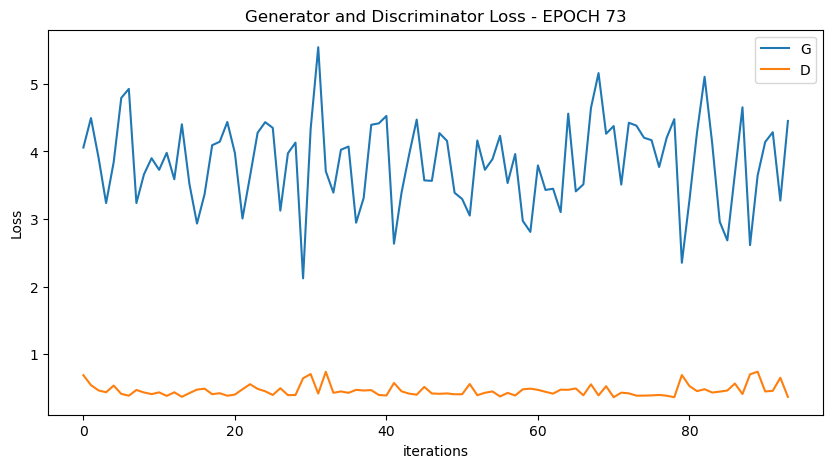

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:12,  1.55s/it]

[75/100][47/94] Loss_D: 0.6897 Loss_G: 2.3630 D(x): 0.5401 D(G(z)): 0.0141 / 0.1059


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:23<00:00,  1.52s/it]

[75/100][94/94] Loss_D: 1.9184 Loss_G: 2.3740 D(x): 0.1264 D(G(z)): 0.0074 / 0.0834


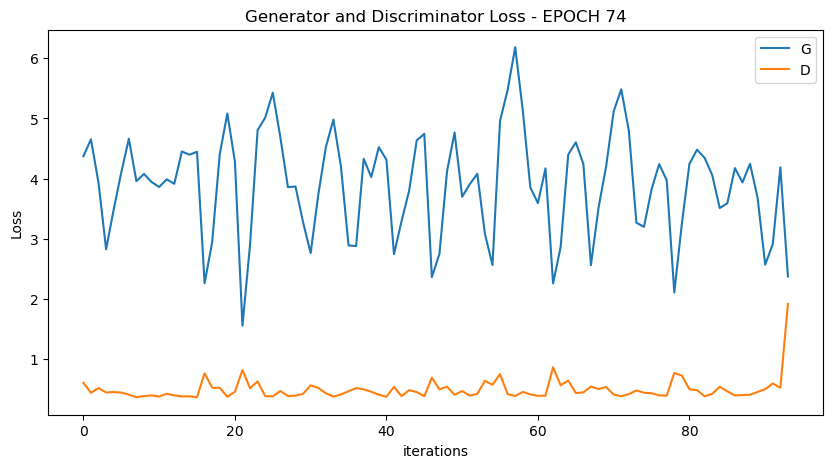

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:12,  1.55s/it]

[76/100][47/94] Loss_D: 0.4365 Loss_G: 3.9712 D(x): 0.9217 D(G(z)): 0.0678 / 0.0180


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[76/100][94/94] Loss_D: 0.4014 Loss_G: 5.2320 D(x): 0.8532 D(G(z)): 0.0057 / 0.0058


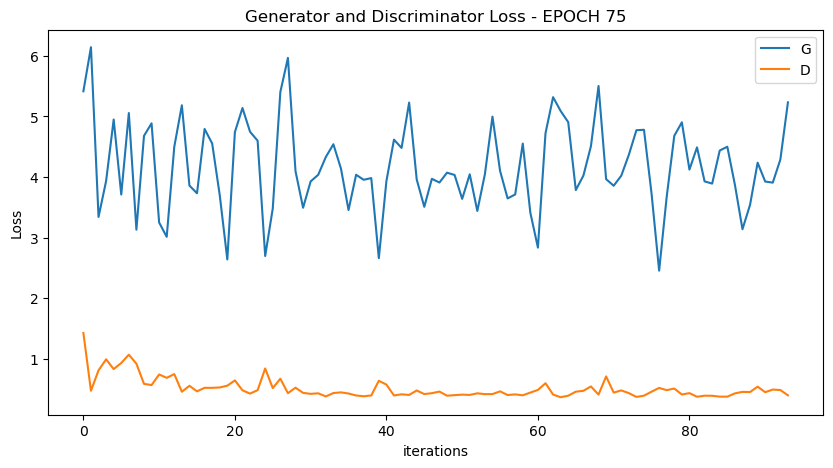

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:11,  1.51s/it]

[77/100][47/94] Loss_D: 0.3665 Loss_G: 4.4101 D(x): 0.8865 D(G(z)): 0.0192 / 0.0101


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[77/100][94/94] Loss_D: 0.4650 Loss_G: 7.2430 D(x): 0.9730 D(G(z)): 0.0029 / 0.0009


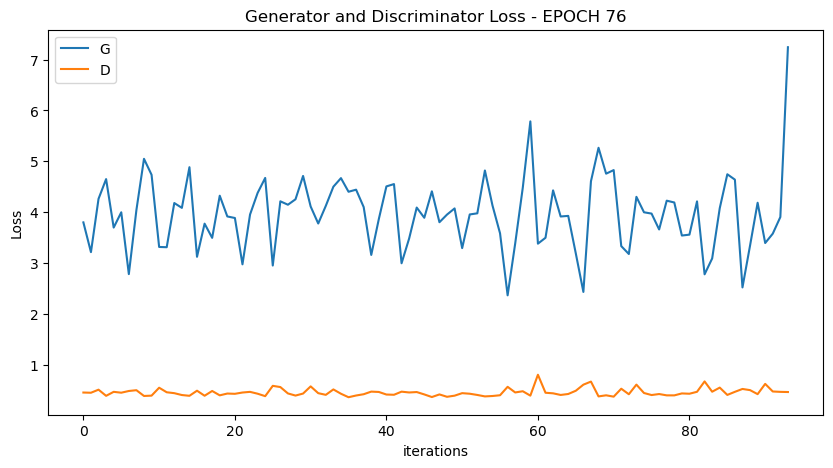

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.50s/it]

[78/100][47/94] Loss_D: 0.4500 Loss_G: 3.0949 D(x): 0.7717 D(G(z)): 0.0251 / 0.0399


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.52s/it]

[78/100][94/94] Loss_D: 0.4933 Loss_G: 3.3148 D(x): 0.7127 D(G(z)): 0.0479 / 0.0269


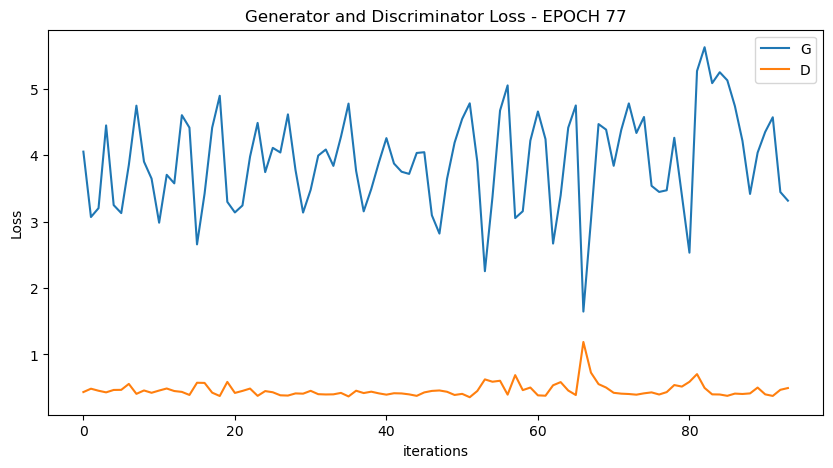

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:22,  1.75s/it]

[79/100][47/94] Loss_D: 0.4175 Loss_G: 3.8188 D(x): 0.8210 D(G(z)): 0.0219 / 0.0244


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[79/100][94/94] Loss_D: 0.3963 Loss_G: 5.9170 D(x): 0.9659 D(G(z)): 0.0044 / 0.0016


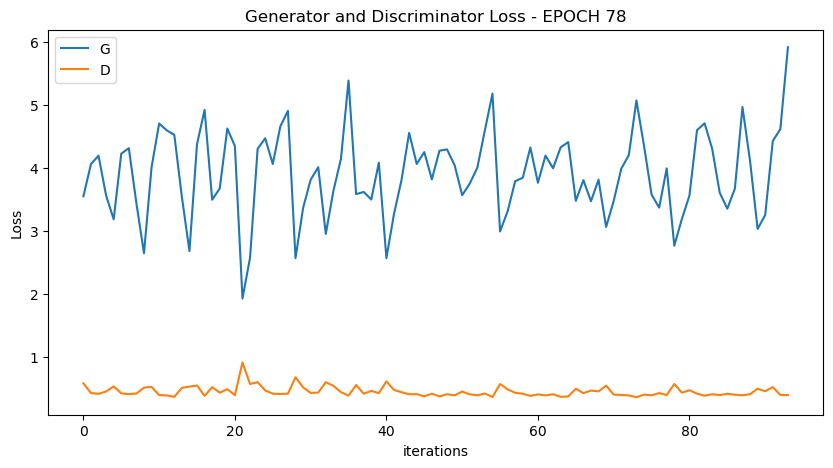

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:23,  1.78s/it]

[80/100][47/94] Loss_D: 0.4250 Loss_G: 3.8920 D(x): 0.7949 D(G(z)): 0.0133 / 0.0166


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[80/100][94/94] Loss_D: 0.5808 Loss_G: 4.8551 D(x): 0.6105 D(G(z)): 0.0012 / 0.0083


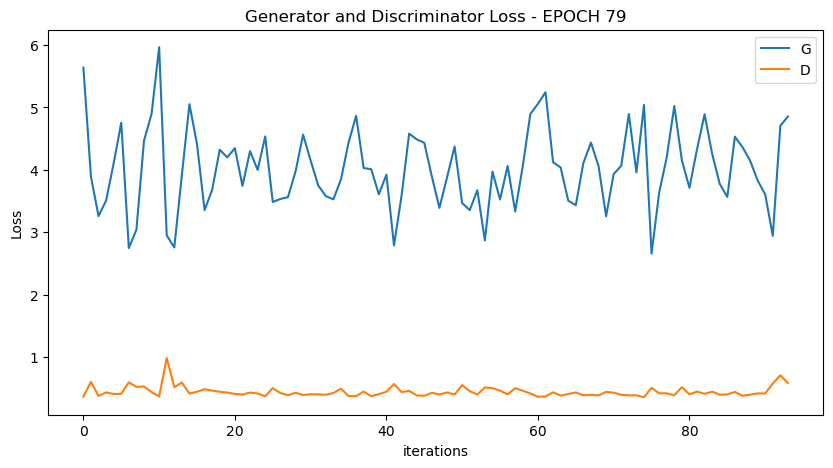

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.77s/it]

[81/100][47/94] Loss_D: 0.3909 Loss_G: 4.9455 D(x): 0.9082 D(G(z)): 0.0139 / 0.0060


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:42<00:00,  1.73s/it]

[81/100][94/94] Loss_D: 1.7364 Loss_G: 0.9053 D(x): 0.1963 D(G(z)): 0.0441 / 0.3874


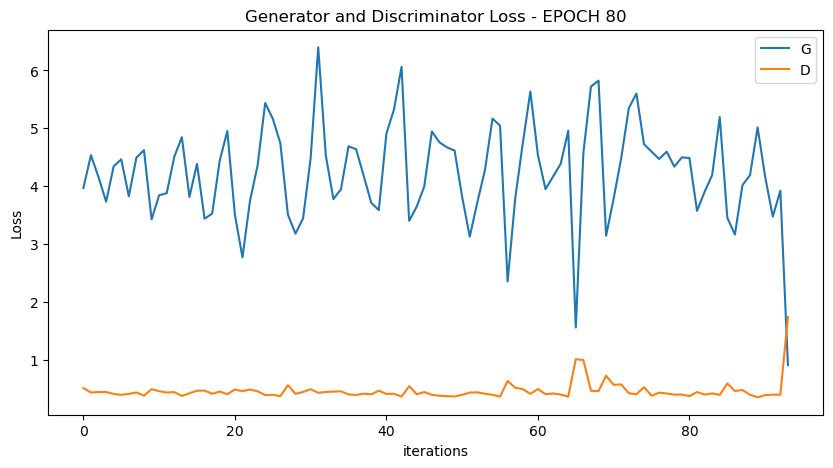

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


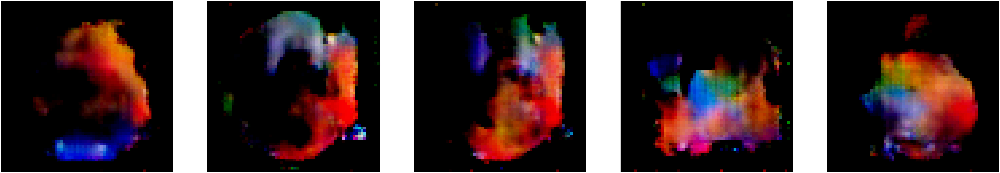

 50%|█████████████████████████████████████████                                         | 47/94 [01:12<01:11,  1.52s/it]

[82/100][47/94] Loss_D: 0.3801 Loss_G: 4.0213 D(x): 0.8675 D(G(z)): 0.0119 / 0.0175


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:32<00:00,  1.62s/it]

[82/100][94/94] Loss_D: 0.6420 Loss_G: 5.4144 D(x): 0.9972 D(G(z)): 0.0376 / 0.0026


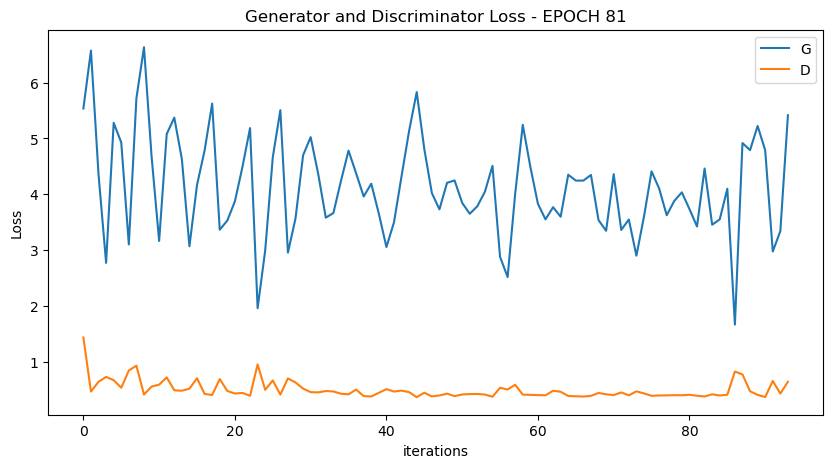

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:21,  1.72s/it]

[83/100][47/94] Loss_D: 0.3807 Loss_G: 4.8348 D(x): 0.9442 D(G(z)): 0.0103 / 0.0059


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[83/100][94/94] Loss_D: 0.3687 Loss_G: 6.4058 D(x): 0.9390 D(G(z)): 0.0021 / 0.0009


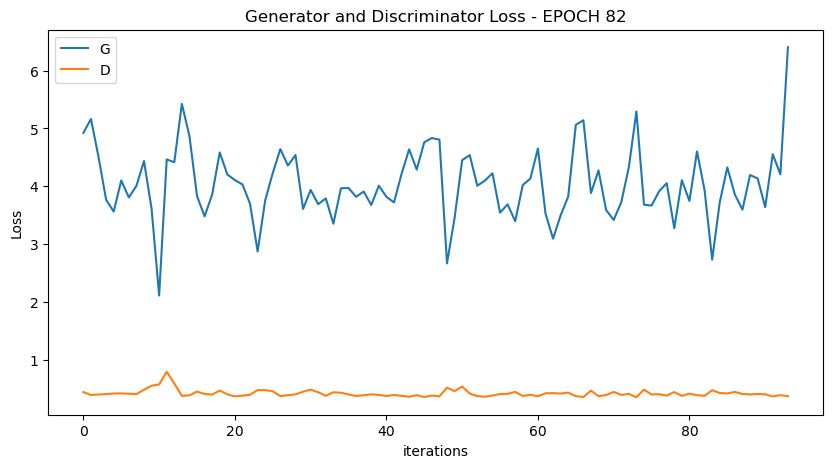

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[84/100][47/94] Loss_D: 0.4207 Loss_G: 3.8836 D(x): 0.8088 D(G(z)): 0.0282 / 0.0187


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[84/100][94/94] Loss_D: 1.1937 Loss_G: 1.9576 D(x): 0.4465 D(G(z)): 0.0099 / 0.2696


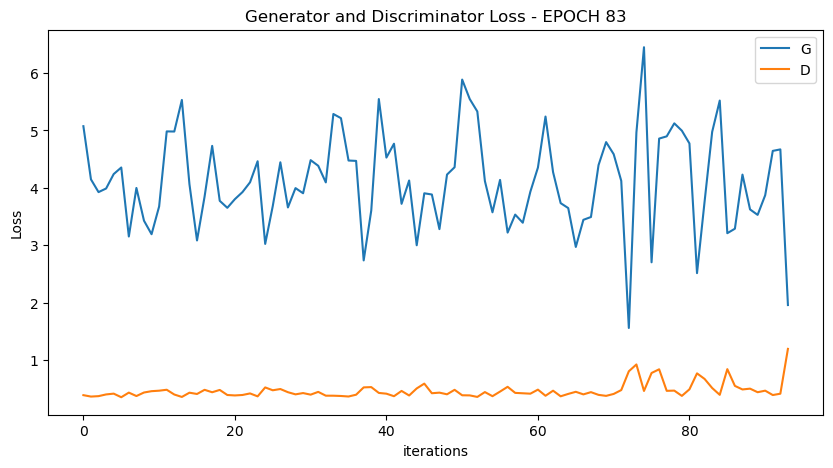

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:24,  1.79s/it]

[85/100][47/94] Loss_D: 0.4260 Loss_G: 4.0604 D(x): 0.9010 D(G(z)): 0.0493 / 0.0151


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:42<00:00,  1.73s/it]

[85/100][94/94] Loss_D: 0.8291 Loss_G: 1.6137 D(x): 0.4964 D(G(z)): 0.0380 / 0.1970


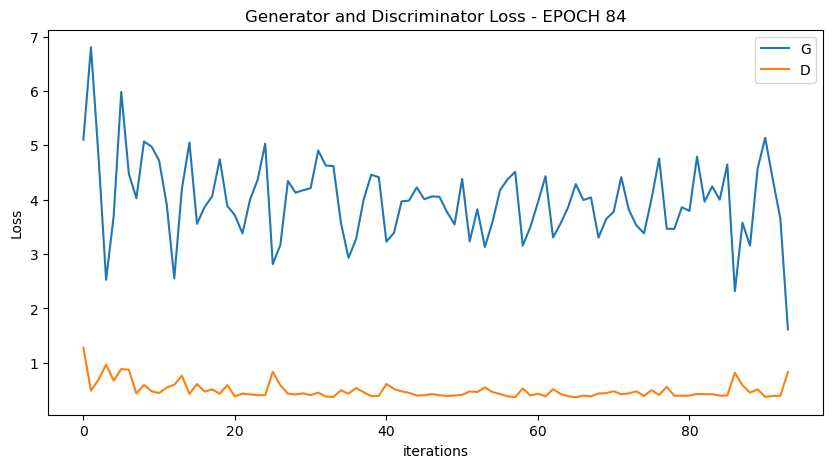

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:21,  1.73s/it]

[86/100][47/94] Loss_D: 0.4815 Loss_G: 4.4776 D(x): 0.9685 D(G(z)): 0.0738 / 0.0096


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[86/100][94/94] Loss_D: 0.9977 Loss_G: 3.5907 D(x): 0.3615 D(G(z)): 0.0011 / 0.0693


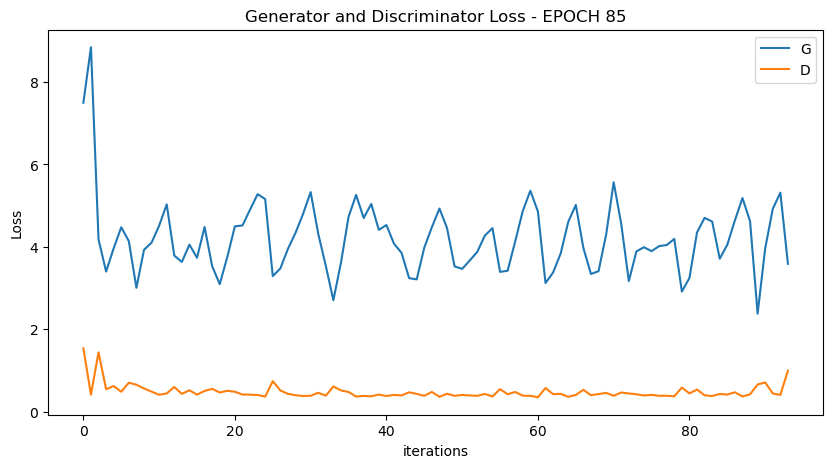

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:21,  1.73s/it]

[87/100][47/94] Loss_D: 0.4393 Loss_G: 3.8869 D(x): 0.9638 D(G(z)): 0.0439 / 0.0163


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:42<00:00,  1.73s/it]

[87/100][94/94] Loss_D: 0.5834 Loss_G: 5.4483 D(x): 0.9926 D(G(z)): 0.0436 / 0.0038


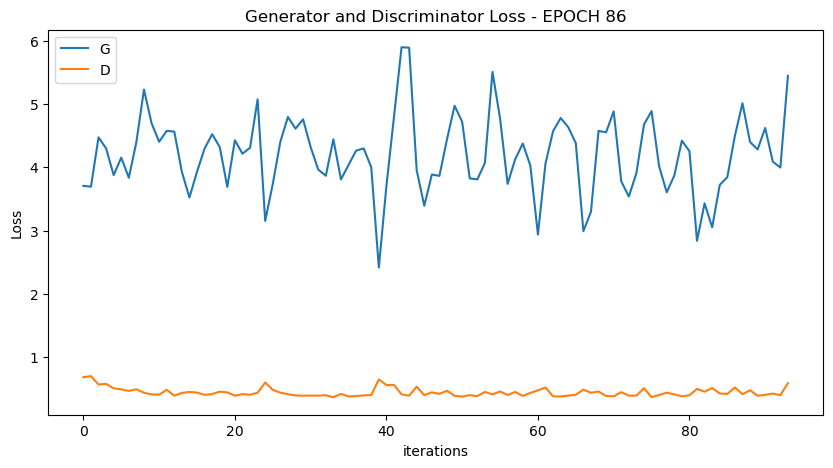

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[88/100][47/94] Loss_D: 0.3964 Loss_G: 4.0293 D(x): 0.9394 D(G(z)): 0.0181 / 0.0165


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:39<00:00,  1.70s/it]

[88/100][94/94] Loss_D: 0.3413 Loss_G: 5.3334 D(x): 0.8964 D(G(z)): 0.0075 / 0.0032


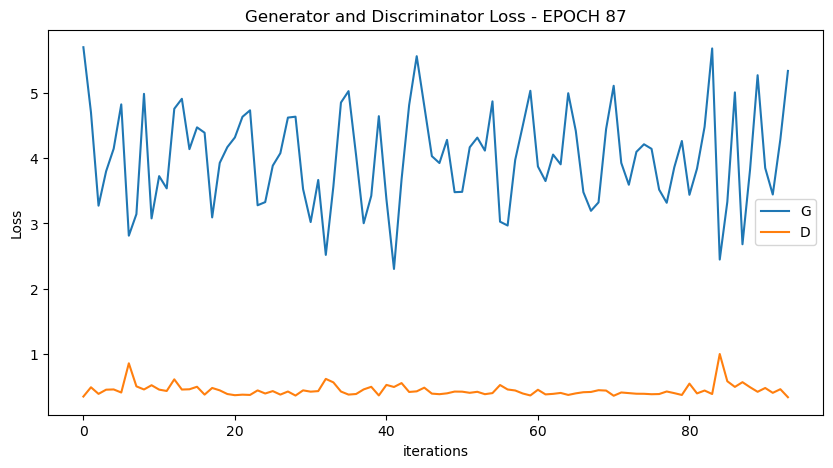

 50%|█████████████████████████████████████████                                         | 47/94 [01:11<01:10,  1.50s/it]

[89/100][47/94] Loss_D: 0.5495 Loss_G: 3.6037 D(x): 0.9482 D(G(z)): 0.1421 / 0.0222


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:22<00:00,  1.51s/it]

[89/100][94/94] Loss_D: 0.3716 Loss_G: 4.3909 D(x): 0.8582 D(G(z)): 0.0292 / 0.0079


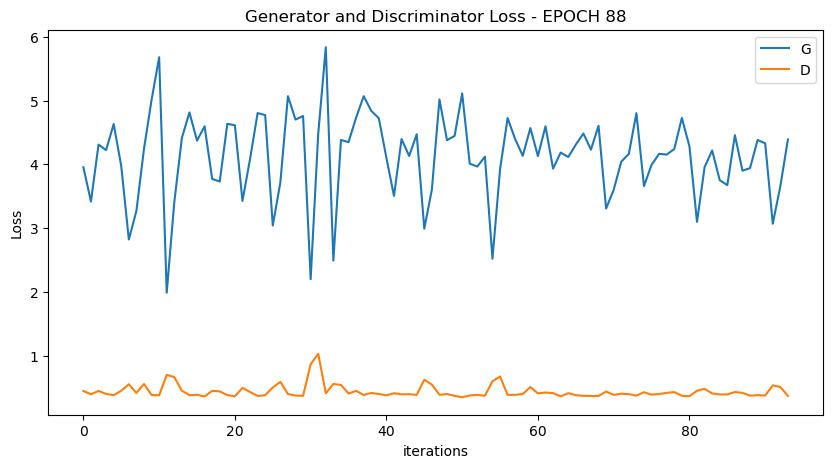

 50%|█████████████████████████████████████████                                         | 47/94 [01:13<01:14,  1.59s/it]

[90/100][47/94] Loss_D: 0.5670 Loss_G: 2.9148 D(x): 0.6455 D(G(z)): 0.0127 / 0.0571


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:28<00:00,  1.58s/it]

[90/100][94/94] Loss_D: 0.4464 Loss_G: 5.4526 D(x): 0.9832 D(G(z)): 0.0106 / 0.0026


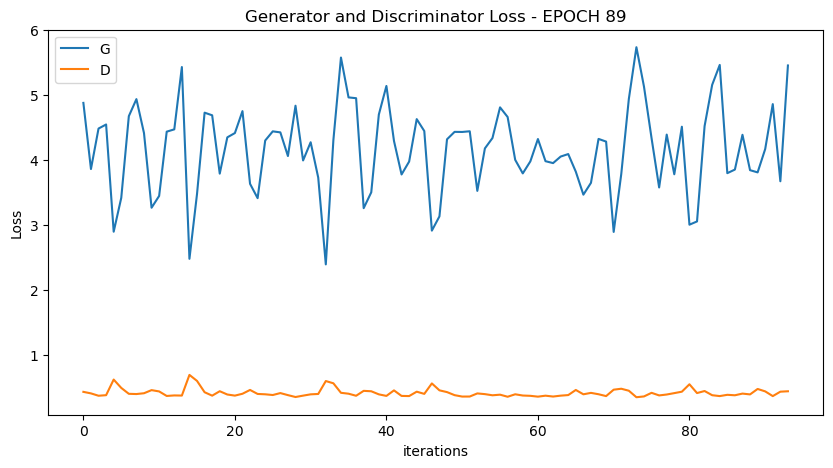

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[91/100][47/94] Loss_D: 0.4247 Loss_G: 3.6075 D(x): 0.7695 D(G(z)): 0.0179 / 0.0213


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:43<00:00,  1.74s/it]

[91/100][94/94] Loss_D: 0.4872 Loss_G: 4.2756 D(x): 0.6890 D(G(z)): 0.0074 / 0.0120


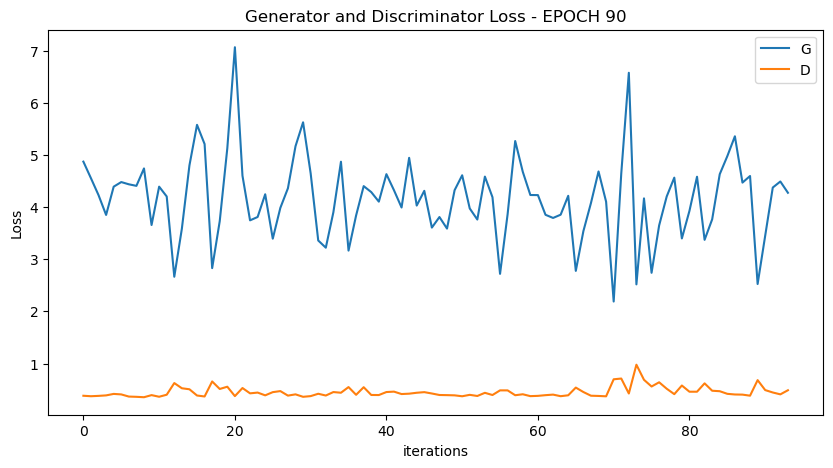

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


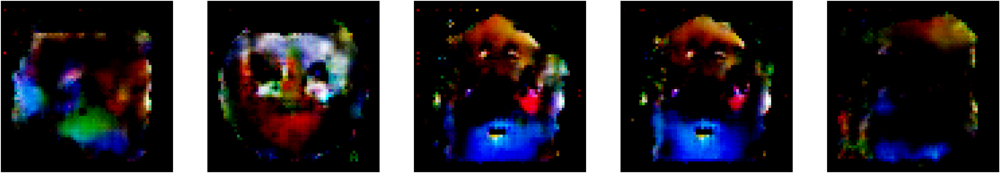

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:23,  1.77s/it]

[92/100][47/94] Loss_D: 0.4126 Loss_G: 3.4629 D(x): 0.8185 D(G(z)): 0.0277 / 0.0254


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[92/100][94/94] Loss_D: 0.3559 Loss_G: 4.6309 D(x): 0.9261 D(G(z)): 0.0084 / 0.0062


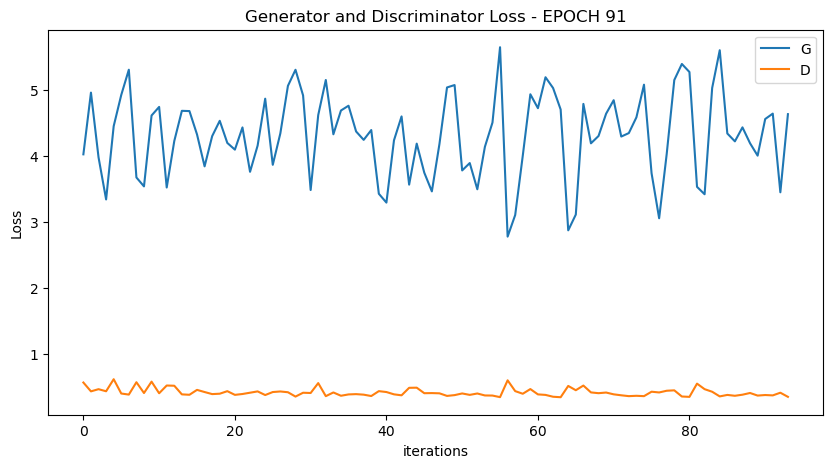

 50%|█████████████████████████████████████████                                         | 47/94 [01:21<01:17,  1.65s/it]

[93/100][47/94] Loss_D: 0.3950 Loss_G: 4.5296 D(x): 0.9519 D(G(z)): 0.0237 / 0.0090


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:36<00:00,  1.67s/it]

[93/100][94/94] Loss_D: 0.4704 Loss_G: 3.3704 D(x): 0.7797 D(G(z)): 0.0215 / 0.0316


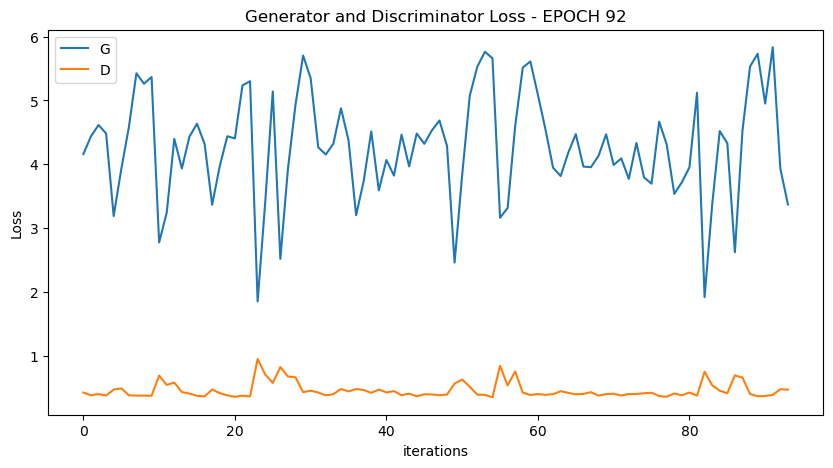

 50%|█████████████████████████████████████████                                         | 47/94 [01:19<01:16,  1.62s/it]

[94/100][47/94] Loss_D: 0.3743 Loss_G: 4.2128 D(x): 0.8872 D(G(z)): 0.0160 / 0.0121


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:39<00:00,  1.70s/it]

[94/100][94/94] Loss_D: 0.5880 Loss_G: 3.4771 D(x): 0.5913 D(G(z)): 0.0087 / 0.0223


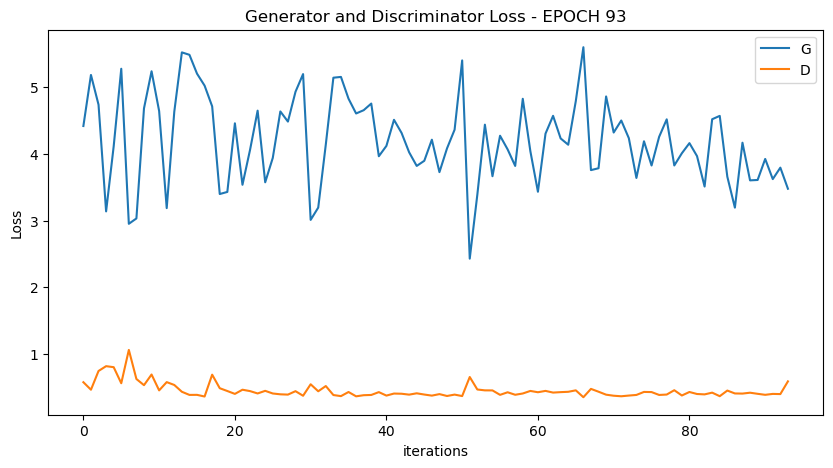

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:22,  1.76s/it]

[95/100][47/94] Loss_D: 0.4772 Loss_G: 4.6725 D(x): 0.9732 D(G(z)): 0.0472 / 0.0074


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[95/100][94/94] Loss_D: 0.6294 Loss_G: 4.5688 D(x): 0.9969 D(G(z)): 0.0103 / 0.0068


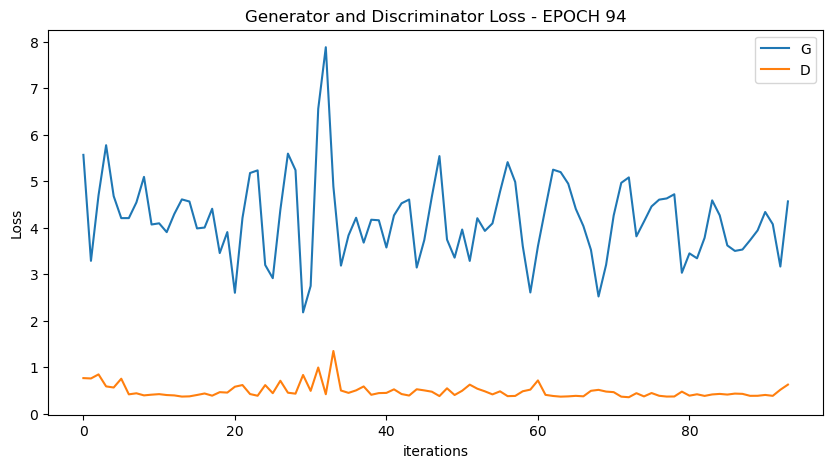

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:22,  1.77s/it]

[96/100][47/94] Loss_D: 0.5803 Loss_G: 2.8266 D(x): 0.6420 D(G(z)): 0.0118 / 0.0609


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[96/100][94/94] Loss_D: 0.9275 Loss_G: 1.9414 D(x): 0.4047 D(G(z)): 0.0124 / 0.1435


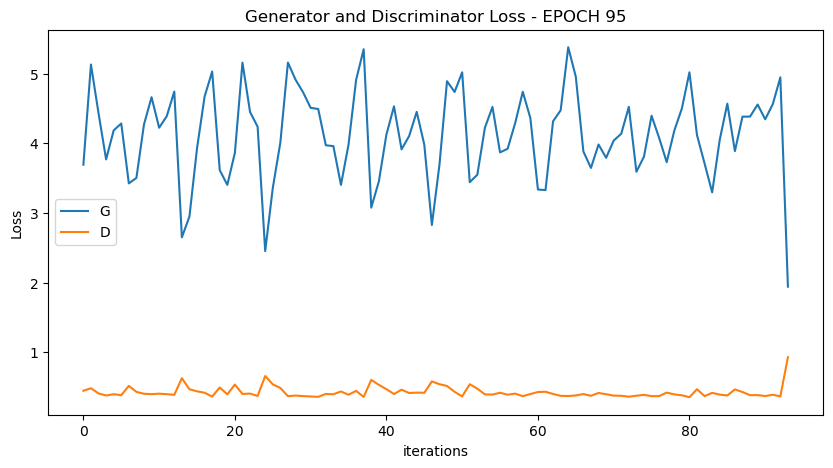

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:25,  1.82s/it]

[97/100][47/94] Loss_D: 0.4388 Loss_G: 3.9671 D(x): 0.7661 D(G(z)): 0.0138 / 0.0179


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[97/100][94/94] Loss_D: 0.3786 Loss_G: 5.6497 D(x): 0.8575 D(G(z)): 0.0017 / 0.0021


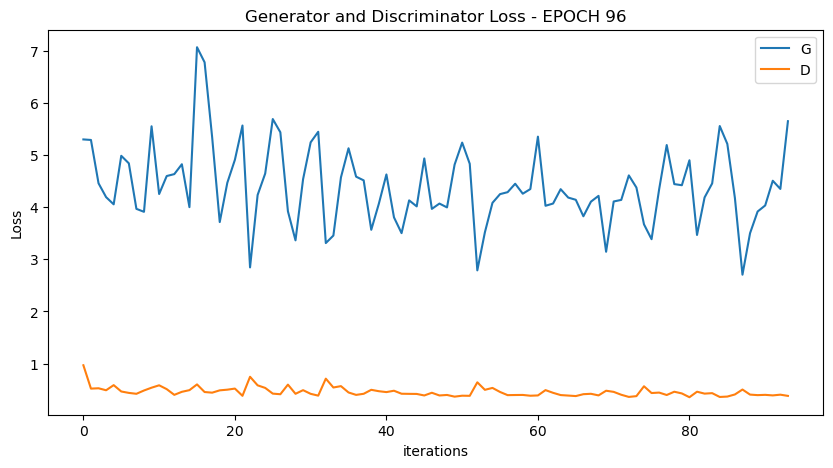

 50%|█████████████████████████████████████████                                         | 47/94 [01:23<01:23,  1.77s/it]

[98/100][47/94] Loss_D: 0.4395 Loss_G: 4.4778 D(x): 0.8882 D(G(z)): 0.0845 / 0.0110


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:45<00:00,  1.76s/it]

[98/100][94/94] Loss_D: 0.3941 Loss_G: 6.6264 D(x): 0.9573 D(G(z)): 0.0017 / 0.0007


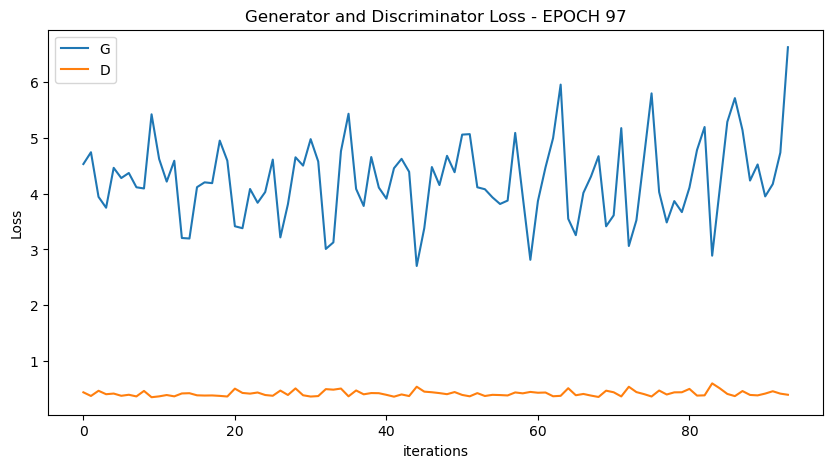

 50%|█████████████████████████████████████████                                         | 47/94 [01:22<01:22,  1.75s/it]

[99/100][47/94] Loss_D: 0.4849 Loss_G: 3.5689 D(x): 0.9489 D(G(z)): 0.1100 / 0.0237


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:44<00:00,  1.75s/it]

[99/100][94/94] Loss_D: 0.3391 Loss_G: 6.5185 D(x): 0.9270 D(G(z)): 0.0047 / 0.0013


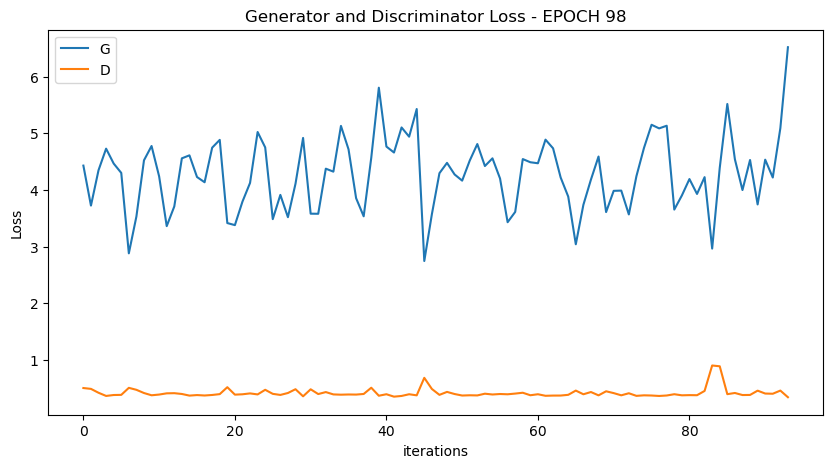

 50%|█████████████████████████████████████████                                         | 47/94 [01:27<01:23,  1.78s/it]

[100/100][47/94] Loss_D: 0.4342 Loss_G: 3.6756 D(x): 0.7707 D(G(z)): 0.0196 / 0.0236


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [02:48<00:00,  1.79s/it]

[100/100][94/94] Loss_D: 0.6696 Loss_G: 2.9441 D(x): 0.5949 D(G(z)): 0.0023 / 0.0506


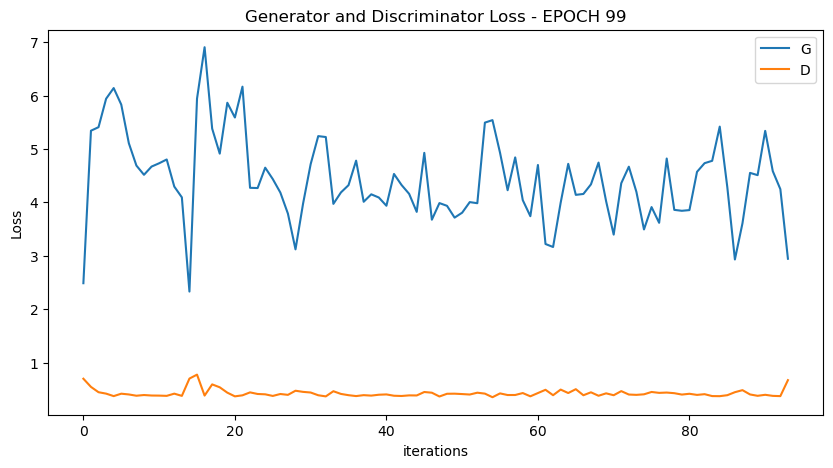

In [ ]:
import time
from tqdm import tqdm
from torch.utils.data import DataLoader

for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

The discriminator's loss (0.6696) is relatively high compared to the generator's loss (2.9441). This suggests that the discriminator is able to easily distinguish between real and generated images, but the generator may be struggling to produce realistic images.

A high value of D(x) indicates that the discriminator is correctly identifying real images.
A low value of D(G(x)) indicates that the discriminator is correctly identifying the generated images as fake.

The generator aims to generate images that are increasingly difficult for the discriminator to differentiate from real images by maximizing the value of D(G(x)). 

In [ ]:
import numpy as np

print (">> average EPOCH duration = ", np.mean(epoch_time))


>> average EPOCH duration =  169.93148774862289


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

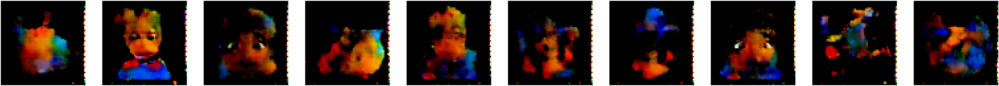

In [ ]:
show_generated_img(10)

This code generates a batch of generated images using the trained generator network and saves them as image files in a specified directory.

In [ ]:
from PIL import Image
import torchvision.utils as vutils

if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        vutils.save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [02:45<00:00,  1.21it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

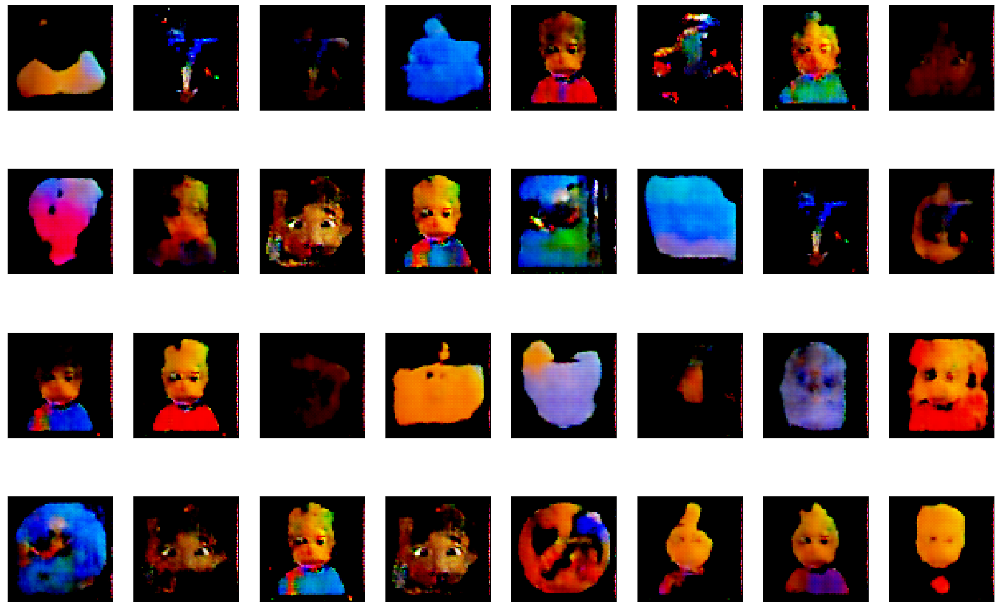

In [ ]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

In [ ]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'C:\\Users\\lenovo\\Downloads\\images.zip'

In [ ]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

In [ ]:
!dir ..\output_images


 Le volume dans le lecteur C n'a pas de nom.
 Le num‚ro de s‚rie du volume est 3248-2E87

 R‚pertoire de C:\Users\lenovo\output_images

19/04/2023  03:31    <DIR>          .
19/04/2023  03:31    <DIR>          ..
19/04/2023  03:28             2ÿ791 image_00000.png
19/04/2023  03:28             4ÿ518 image_00001.png
19/04/2023  03:28             4ÿ408 image_00002.png
19/04/2023  03:28             1ÿ705 image_00003.png
19/04/2023  03:28             2ÿ817 image_00004.png
19/04/2023  03:28             2ÿ555 image_00005.png
19/04/2023  03:29             1ÿ807 image_00006.png
19/04/2023  03:29             2ÿ846 image_00007.png
19/04/2023  03:29             2ÿ737 image_00008.png
19/04/2023  03:29             5ÿ609 image_00009.png
19/04/2023  03:29             4ÿ754 image_00010.png
19/04/2023  03:29             2ÿ266 image_00011.png
19/04/2023  03:29             1ÿ737 image_00012.png
19/04/2023  03:29             3ÿ930 image_00013.png
19/04/2023  03:29             1ÿ320 image_00014.png
19/04/2

# //////////////Evaluation

In [ ]:
import numpy as np

# Extract a batch of images from the train_loader
imgs, labels = next(iter(train_loader))

# Convert the tensor to a NumPy array and transpose the dimensions
imgs = imgs.numpy().transpose(0, 2, 3, 1)

# Rescale the pixel values from [-1, 1] to [0, 1]
real_samples = (imgs + 1) / 2


In [ ]:
import torch

# Load the saved GAN model
netG = Generator()
netG.load_state_dict(torch.load('generator.pth'))

# Generate a batch of random noise vectors
batch_size = 32
noise = torch.randn(batch_size, 100, 1, 1)

# Generate fake images from the noise vectors using the generator
fake_samples = netG(noise).detach().numpy()

# Rescale the pixel values from [-1, 1] to [0, 1]
fake_samples = (fake_images + 1) / 2


In [ ]:
import numpy as np

def precision_recall(real_samples, generated_samples, threshold=0.5):
    # Compute precision and recall
    true_positives = np.sum(generated_samples >= threshold)
    false_positives = np.sum(generated_samples < threshold)
    false_negatives = np.sum(real_samples >= threshold) - true_positives
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    # Compute F1 score
    f1_score = 2 * (precision * recall) / (precision + recall)
    return precision, recall, f1_score
# Example usage
real_samples = np.random.rand(1000)
generated_samples = np.random.rand(1000)
precision, recall, f1_score = precision_recall(real_samples, generated_samples, threshold=0.5)
print("Precision: {:.4f}".format(precision))
print("Recall: {:.4f}".format(recall))
print("F1 Score: {:.4f}".format(f1_score))


Precision: 0.4800
Recall: 0.9284
F1 Score: 0.6328


These results indicate that the model has a high recall (i.e., it correctly identifies most of the true positive samples) but a low precision (i.e., it also identifies many false positive samples). The F1 score indicates that the model has a moderate performance in terms of both precision and recall.

# /////////////////////////////////////Text

# Simple RNN


In [ ]:
import tensorflow as tf

# Detect hardware, return appropriate distribution strategy
try:
    # TPU detection. No parameters necessary if TPU_NAME environment variable is
    # set: this is always the case on Kaggle.
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    # Default distribution strategy in Tensorflow. Works on CPU and single GPU.
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


Writing a function for getting auc score for validation



In [ ]:
from tensorflow.keras import metrics
from sklearn.metrics import roc_curve, auc
def roc_auc(predictions,target):
    '''
    This methods returns the AUC Score when given the Predictions
    and Labels
    '''
    
    fpr, tpr, thresholds = roc_curve(target, predictions)
    roc_auc = auc(fpr, tpr)
    return roc_auc

In [ ]:
from sklearn.model_selection import train_test_split

xtrain, xvalid, ytrain, yvalid = train_test_split(train_df['clean_text'].values,train_df['label'].values, 
                                                  stratify=train_df['label'].values, 
                                                  random_state=42, 
                                                  test_size=0.2, shuffle=True)

In [ ]:
train_df['clean_text'].apply(lambda x:len(str(x).split())).max()


42

In [ ]:
from keras.preprocessing import sequence, text
from keras.callbacks import EarlyStopping


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing import sequence

# using keras tokenizer here
token = text.Tokenizer(num_words=None)
max_len = 100

token.fit_on_texts(list(xtrain) + list(xvalid))
xtrain_seq = token.texts_to_sequences(xtrain)
xvalid_seq = token.texts_to_sequences(xvalid)

#zero pad the sequences
xtrain_pad = sequence.pad_sequences(xtrain_seq, maxlen=max_len)
xvalid_pad = sequence.pad_sequences(xvalid_seq, maxlen=max_len)

word_index = token.word_index

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, SimpleRNN, Dense
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense

with strategy.scope():
    # A simpleRNN without any pretrained embeddings and one dense layer
    model = Sequential()
    model.add(Embedding(len(word_index) + 1,
                     300,
                     input_length=max_len))
    model.add(SimpleRNN(100))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 300)          1222200   
                                                                 
 simple_rnn (SimpleRNN)      (None, 100)               40100     
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 1,262,401
Trainable params: 1,262,401
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(xtrain_pad, ytrain, epochs=5, batch_size=64*strategy.num_replicas_in_sync) #Multiplying by Strategy to run on TPU's


Epoch 1/5
94/94 [==============================] - 9s 62ms/step - loss: 0.7094 - accuracy: 0.4761
Epoch 2/5
94/94 [==============================] - 5s 57ms/step - loss: 0.6998 - accuracy: 0.4901
Epoch 3/5
94/94 [==============================] - 5s 58ms/step - loss: 0.6987 - accuracy: 0.5114
Epoch 4/5
94/94 [==============================] - 6s 60ms/step - loss: 0.6959 - accuracy: 0.5086
Epoch 5/5
94/94 [==============================] - 6s 64ms/step - loss: 0.6963 - accuracy: 0.5066


In [ ]:
scores = model.predict(xvalid_pad)
print("Auc: %.2f%%" % (roc_auc(scores,yvalid)))

47/47 [==============================] - 1s 12ms/step
Auc: 0.25%


In [ ]:
loss, accuracy = model.evaluate(xvalid_pad, yvalid, verbose=0)
print('Accuracy: %.2f%%' % (accuracy*100))


Accuracy: 31.80%


In [ ]:
scores_model = []
scores_model.append({'Model': 'SimpleRNN','AUC_Score': roc_auc(scores,yvalid)})

# ////////////////Word Embeddings

In [ ]:
# load the GloVe vectors in a dictionary:
from tqdm import tqdm

embeddings_index = {}
f = open('glove.840B.300d.txt','r',encoding='utf-8')
for line in tqdm(f):
    values = line.split(' ')
    word = values[0]
    coefs = np.asarray([float(val) for val in values[1:]])
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

2196017it [10:36, 3449.31it/s]


Found 2196016 word vectors.


In [ ]:
from tqdm import tqdm
# create an embedding matrix for the words we have in the dataset
embedding_matrix = np.zeros((len(word_index) + 1, 300))
for word, i in tqdm(word_index.items()):
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

100%|██████████████████████████████████████████████████████████████████████████████| 4073/4073 [01:51<00:00, 36.37it/s]


# LSTM

In [ ]:
from tensorflow.keras.layers import LSTM

with strategy.scope():
    
    # A simple LSTM with glove embeddings and one dense layer
    model = Sequential()
    model.add(Embedding(len(word_index) + 1,
                     300,
                     weights=[embedding_matrix],
                     input_length=max_len,
                     trainable=False))

    model.add(LSTM(100, dropout=0.3, recurrent_dropout=0.3))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
    
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 300)          1222200   
                                                                 
 lstm (LSTM)                 (None, 100)               160400    
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 1,382,701
Trainable params: 160,501
Non-trainable params: 1,222,200
_________________________________________________________________


In [ ]:
model.fit(xtrain_pad, ytrain, epochs=5, batch_size=64*strategy.num_replicas_in_sync)


Epoch 1/5
94/94 [==============================] - 63s 236ms/step - loss: 0.7051 - accuracy: 0.4665
Epoch 2/5
94/94 [==============================] - 21s 219ms/step - loss: 0.6979 - accuracy: 0.4863
Epoch 3/5
94/94 [==============================] - 24s 258ms/step - loss: 0.6959 - accuracy: 0.5011
Epoch 4/5
94/94 [==============================] - 26s 275ms/step - loss: 0.6946 - accuracy: 0.5061
Epoch 5/5
94/94 [==============================] - 27s 290ms/step - loss: 0.6939 - accuracy: 0.5082


In [ ]:
scores = model.predict(xvalid_pad)
print("Auc: %.2f%%" % (roc_auc(scores,yvalid)))

47/47 [==============================] - 4s 68ms/step
Auc: 0.28%


In [ ]:
loss, accuracy = model.evaluate(xvalid_pad, yvalid, verbose=0)
print('Accuracy: %.2f%%' % (accuracy*100))


Accuracy: 34.13%


In [ ]:
scores_model.append({'Model': 'LSTM','AUC_Score': roc_auc(scores,yvalid)})


# GRU

In [ ]:
from keras.layers import SpatialDropout1D
from keras.layers import GRU

with strategy.scope():
    # GRU with glove embeddings and two dense layers
     model = Sequential()
     model.add(Embedding(len(word_index) + 1,
                     300,
                     weights=[embedding_matrix],
                     input_length=max_len,
                     trainable=False))
     model.add(SpatialDropout1D(0.3))
     model.add(GRU(300))
     model.add(Dense(1, activation='sigmoid'))

     model.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])   
    
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 300)          1222200   
                                                                 
 spatial_dropout1d (SpatialD  (None, 100, 300)         0         
 ropout1D)                                                       
                                                                 
 gru (GRU)                   (None, 300)               541800    
                                                                 
 dense_2 (Dense)             (None, 1)                 301       
                                                                 
Total params: 1,764,301
Trainable params: 542,101
Non-trainable params: 1,222,200
_________________________________________________________________


In [ ]:
model.fit(xtrain_pad, ytrain, epochs=5, batch_size=64*strategy.num_replicas_in_sync)


Epoch 1/5
94/94 [==============================] - 39s 355ms/step - loss: 0.7224 - accuracy: 0.4775
Epoch 2/5
94/94 [==============================] - 36s 379ms/step - loss: 0.7070 - accuracy: 0.4886
Epoch 3/5
94/94 [==============================] - 35s 374ms/step - loss: 0.7040 - accuracy: 0.4828
Epoch 4/5
94/94 [==============================] - 35s 374ms/step - loss: 0.6986 - accuracy: 0.5037
Epoch 5/5
94/94 [==============================] - 35s 373ms/step - loss: 0.6980 - accuracy: 0.4963


In [ ]:
scores = model.predict(xvalid_pad)
print("Auc: %.2f%%" % (roc_auc(scores,yvalid)))

47/47 [==============================] - 5s 97ms/step
Auc: 0.30%


In [ ]:
loss, accuracy = model.evaluate(xvalid_pad, yvalid, verbose=0)
print('Accuracy: %.2f%%' % (accuracy*100))

Accuracy: 39.25%


In [ ]:
scores_model.append({'Model': 'GRU','AUC_Score': roc_auc(scores,yvalid)})


# Bi-Directional RNN's

In [ ]:
from tensorflow.keras.layers import Bidirectional
from keras.layers import LSTM

with strategy.scope():
    # A simple bidirectional LSTM with glove embeddings and one dense layer
    model = Sequential()
    model.add(Embedding(len(word_index) + 1,
                     300,
                     weights=[embedding_matrix],
                     input_length=max_len,
                     trainable=False))
    model.add(Bidirectional(LSTM(300, dropout=0.3, recurrent_dropout=0.3)))

    model.add(Dense(1,activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
    
    
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 100, 300)          1222200   
                                                                 
 bidirectional (Bidirectiona  (None, 600)              1442400   
 l)                                                              
                                                                 
 dense_3 (Dense)             (None, 1)                 601       
                                                                 
Total params: 2,665,201
Trainable params: 1,443,001
Non-trainable params: 1,222,200
_________________________________________________________________


In [ ]:
model.fit(xtrain_pad, ytrain, epochs=5, batch_size=64*strategy.num_replicas_in_sync)


Epoch 1/5
94/94 [==============================] - 247s 3s/step - loss: 0.7060 - accuracy: 0.4543
Epoch 2/5
94/94 [==============================] - 288s 3s/step - loss: 0.6964 - accuracy: 0.4934
Epoch 3/5
94/94 [==============================] - 329s 4s/step - loss: 0.6947 - accuracy: 0.4993
Epoch 4/5
94/94 [==============================] - 339s 4s/step - loss: 0.6944 - accuracy: 0.5062
Epoch 5/5
94/94 [==============================] - 345s 4s/step - loss: 0.6930 - accuracy: 0.5099


In [ ]:
scores = model.predict(xvalid_pad)
print("Auc: %.2f%%" % (roc_auc(scores,yvalid)))

47/47 [==============================] - 39s 812ms/step
Auc: 0.31%


In [ ]:
loss, accuracy = model.evaluate(xvalid_pad, yvalid, verbose=0)
print('Accuracy: %.2f%%' % (accuracy*100))


Accuracy: 36.99%


In [ ]:
scores_model.append({'Model': 'Bi-Directional RNN','AUC_Score': roc_auc(scores,yvalid)})


# //////////////////////Evaluation

In [ ]:
scores_model


[{'Model': 'SimpleRNN', 'AUC_Score': 0.2503930928974134},
 {'Model': 'LSTM', 'AUC_Score': 0.27706674788225627},
 {'Model': 'GRU', 'AUC_Score': 0.29536593053233984},
 {'Model': 'Bi-Directional RNN', 'AUC_Score': 0.30683202538459364}]

In [ ]:
# Visualization of Results obtained from various Deep learning models
results = pd.DataFrame(scores_model).sort_values(by='AUC_Score',ascending=False)
results.style.background_gradient(cmap='Blues')

,Model,AUC_Score
3,Bi-Directional RNN,0.306832
2,GRU,0.295366
1,LSTM,0.277067
0,SimpleRNN,0.250393


In [ ]:
/////////////////////////////

In [ ]:
import spacy
from spacy import displacy


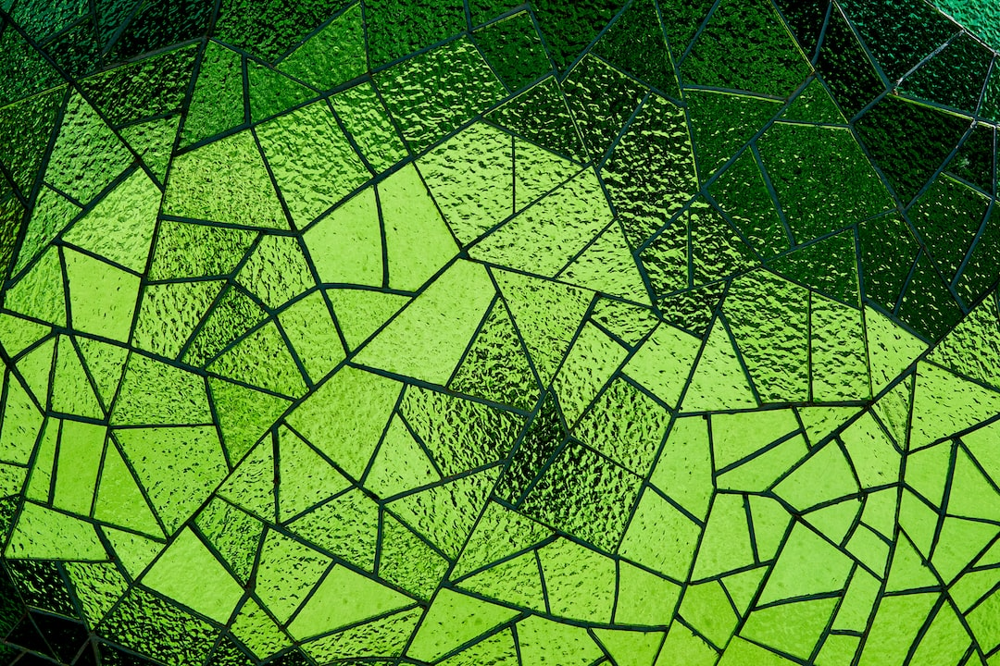
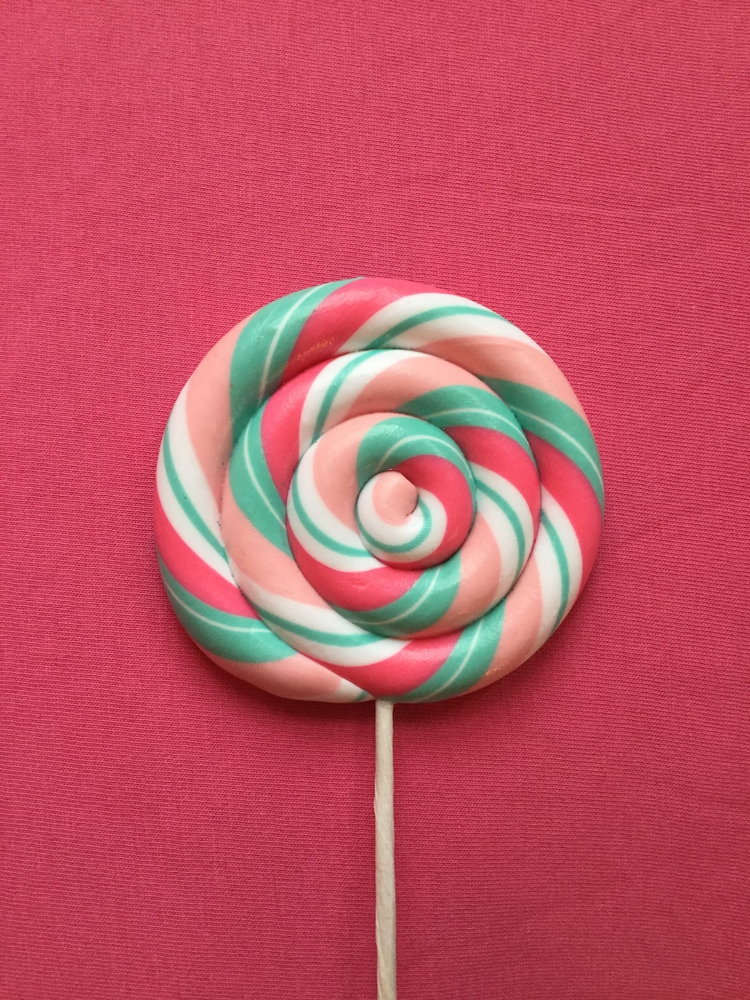

In [ ]:
import spacy
import requests
import json
from IPython.core.display import HTML, display
import base64

nlp = spacy.load('en_core_web_sm')

def display_image(query):
    # Unsplash API configuration
    ACCESS_KEY = 'wVkzeHHRlMaBZqbXUuSvztJ-e7tbWzfnkzYnh1ro8Jo'
    SECRET_KEY = 'bppdQ5KYtOSlb49UTFHpUBC21seT4ECtwUgfGDefwj8'

    # get authorization token
    auth_endpoint = 'https://unsplash.com/oauth/token'
    auth_response = requests.post(auth_endpoint, {
        'grant_type': 'client_credentials',
        'client_id': ACCESS_KEY,
        'client_secret': SECRET_KEY,
    })
    auth_token = json.loads(auth_response.text)['access_token']

    # get image url from Unsplash API
    headers = {'Authorization': f'Bearer {auth_token}'}
    search_endpoint = f'https://api.unsplash.com/search/photos?query={query}'
    search_response = requests.get(search_endpoint, headers=headers)
    image_url = json.loads(search_response.text)['results'][0]['urls']['regular']

    # display image
    img_data = requests.get(image_url).content
    img_html = f'<img src="data:image/png;base64,{base64.b64encode(img_data).decode("utf-8")}" style="width:150px;height:150px;">'
    return img_html


def display_sentence_with_images(sentence):
    doc = nlp(sentence)
    html_elements = []
    for token in doc:
        if token.pos_ == "NOUN":
            img_html = display_image(token.text)
        elif token.pos_ == "nsubj":
            img_html = display_image("person")
        else:
            img_html = ""

        if token.head.i < token.i:
            html_element = f"{img_html} {token.text}"
        else:
            html_element = f"{token.text} {img_html}"
        html_elements.append(html_element)

    html_string = " ".join(html_elements)
    display(HTML(html_string))
    displacy.render(doc, style="dep")

# Example usage
display_sentence_with_images('bobby ate some pieces of candy . then he ate 25 more.')
